# DATA

## What is this notebook about

This notebook builds upon the notebook ``` spacenet6_masking.ipynb ```

``` spacenet6_masking.ipynb ``` is used to generate all the masks for all 3401 training images, using only the PAN images and geojson_buildings files. These masks will be the same regardless of the original data format, hence it is a run-once-and-forget. 


**Image Rotation**

This notebook shall explore the expected input format of the various models.

More specifically, whether rotating the input images matters

**Normalization**

This notebook is to be compared against keras_12B, experiment 1C, 1D, to find out if scaling the float32 values for SAR intensity data to (0,1) will help the model

## Setup COLAB and imports

Mount drive to gain access to files

In [ ]:
''' Used to reference the root directory, for directory traversal ''' 
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
mount_dir = '/content/gdrive'
root_dir = '/content/gdrive/My Drive/Colab Notebooks'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Installations required

In [ ]:
! pip install fiona
! pip install rasterio
! pip install segmentation-models

     |████████████████████████████████| 14.7MB 177kB/s 
     |████████████████████████████████| 18.2MB 50.7MB/s 


Imports required

In [ ]:
''' dealing with .tif files '''
import fiona
import rasterio
from rasterio.mask import mask
from rasterio.plot import show, reshape_as_raster, reshape_as_image

''' plotting images '''
from matplotlib import pyplot as plt
%matplotlib inline

''' traversing directories '''
import os
from pathlib import Path

''' core '''
import numpy as np
import pandas as pd

''' utilities '''
from tqdm import tqdm
import copy
import datetime

''' image processing '''
import tensorflow as tf
from tensorflow.keras.preprocessing import image

''' unet model '''
import segmentation_models_dev as sm
from segmentation_models import Unet
from segmentation_models.losses import JaccardLoss, BinaryFocalLoss
from segmentation_models.metrics import IOUScore, FScore

Using TensorFlow backend.


Segmentation Models: using `keras` framework.


## Global

### Constants, IMG
For reference the various image types are as such (amax is a rough gauge) based on the train_all data

```
type             shape                dtype       gauge of max value    gauge of min value
PAN              (1, 900, 900)        uint16      1844                  0
PS-RGB           (3, 900, 900)        uint8       255                   0
PS-RGBNIR        (4, 900, 900)        uint16      2047                  0
RGBNIR           (4, 450, 450)        uint16      2047                  0
SAR-Intensity    (4, 900, 900)        float32     92.87763              0.0
```



In [ ]:
''' get the same sequence for random set every time '''
seed = 42
np.random.seed = seed
tf.seed = seed       

''' lookup - define image channels for each image type '''
IMG_TYPE_LOOKUP = {
    'PAN': {'channels': 1, 'dtype': np.uint16}, 
    'PS-RGB': {'channels': 3, 'dtype': np.uint8}, 
    'PS-RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'SAR-Intensity': {'channels': 4, 'dtype': np.float32}, 
}

''' image height and width we are working with for the whole notebook '''
IMG_HEIGHT = 256    
IMG_WIDTH = 256

''' root of all paths '''
PATH_SPACENET6 = Path(root_dir + '/spacenet6')
PATH_METRICS = PATH_SPACENET6/'metrics_keras_12.csv'

### SIZE, IDX
We will be setting the amount of data that we want to use for train/test
* There are 3401 images for each image type
* The actual spacenet6 "test folder" has only uneseen SAR-Intensity data

Therefore for training purposes, we will pull out our own "test data" from the training set for ease of verifying output 

Random indexes will be used for training and test

In [ ]:
''' set the various sizes we want to use '''
SIZE_ALL = 3401 
SIZE_TRAIN = 800           # CHANGE HERE
SIZE_TEST = 80            # CHANGE HERE
# 800-80, 1600-160, 3200-201

''' set the various idexes we want to use '''
try:
  TRAIN_IDX = np.load(PATH_SPACENET6/('TRAIN_IDX_'+str(SIZE_TRAIN)+'.npy'))
  TEST_IDX = np.load(PATH_SPACENET6/('TEST_IDX_'+str(SIZE_TEST)+'.npy'))
  print('TRAIN/TEST indexes available. Loading ')
except:
  ''' Generate the indexes that we will be using for train and test '''  
  ALL_IDX = np.arange(SIZE_ALL)

  TRAIN_IDX = np.random.choice(ALL_IDX, SIZE_TRAIN, replace=False)
  TRAIN_IDX.sort()

  ALL_IDX_2 = np.setdiff1d(ALL_IDX, TRAIN_IDX)

  TEST_IDX = np.random.choice(ALL_IDX_2, SIZE_TEST, replace=False)
  TEST_IDX.sort()

  np.save(PATH_SPACENET6/('TRAIN_IDX_'+str(SIZE_TRAIN)), TRAIN_IDX)
  np.save(PATH_SPACENET6/('TEST_IDX_'+str(SIZE_TEST)), TEST_IDX)
  print('TRAIN/TEST indexes not available. Generated and saved ')

TRAIN/TEST indexes available. Loading 


### Rotation file
These are the images that have been rotated

In [ ]:
TO_ROTATE = []
PATH_ORIENTATIONS = PATH_SPACENET6/'spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SummaryData/SAR_orientations.txt'

orientation_file = open(PATH_ORIENTATIONS, "r")
for line in orientation_file:
  tilename = line.split(' ')[0]
  orientation_flag = int(line.split(' ')[1])

  if orientation_flag == 1:
    TO_ROTATE.append(tilename)

TO_ROTATE.sort()

print('orientation file loaded')

orientation file loaded


## Helper functions

### rotation()

In [ ]:
def rotation(filename, img):
  try:
    if filename.split(IMG_TYPE+'_')[1].split('_tile_')[0] in TO_ROTATE:
      return np.fliplr(np.flipud(img))
    else:
      return img
  except: 
    pass

  try:
    if filename.split('Buildings_')[1].split('_tile_')[0] in TO_ROTATE:
      return np.fliplr(np.flipud(img))
    else:
      return img
  except: 
    pass
      
  
  return img

### plot_XY()

In [ ]:
def plot_XY(plotname, X, Y, X_name, Y_name):
  ix = np.random.randint(0, len(X))
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,5))
  show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  plt.show()

### plot_XY_preds()

In [ ]:
def plot_XY_preds(plotname, X, Y, P, X_name, Y_name, P_name, index=None):
  if index==None:
    ix = np.random.randint(0, len(X))
  else:
    ix = index
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  if X.dtype == 'float32':
    show(reshape_as_raster(  (X[ix] - np.amin(X)) / (np.amax(X) - np.amin(X))   ), ax=ax1, title=X_name)
  else:
    show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  show(reshape_as_raster(P[ix]), ax=ax3, title=P_name)
  plt.show()

### plot_history()

In [ ]:
def plot_history(history):
  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  ax1.plot(history['loss'], label='train')
  ax1.plot(history['val_loss'], label='val')
  ax1.title.set_text('loss')
  ax1.legend()

  ax2.plot(history['iou_score'], label='train')
  ax2.plot(history['val_iou_score'], label='val')
  ax2.title.set_text('iou_score')
  ax2.legend()

  ax3.plot(history['f1-score'], label='train')
  ax3.plot(history['val_f1-score'], label='val')
  ax3.title.set_text('f1-score')
  ax3.legend()

### store_metrics()
Save into the metrics file

In [ ]:
try: 
  METRICS_HISTORY = pd.read_csv(PATH_METRICS)
except:
  TIMESTAMP = datetime.datetime.now().strftime("%d/%m/%Y %H:%M:%S")
  IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS = 'trial', 'trial', 'trial', 'trial', 'trial', 'trial', 'trial'
  MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score = 0,0,0,0,0,0,0,0,0,0,0,0,0

  METRICS_HISTORY = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, 
                              test_loss, test_iou_score, test_f1_score,
                              val_loss, val_iou_score, val_f1_score, 
                              train_loss, train_iou_score, train_f1_score
                              ]]),
                    columns=['timestamp', 'img_type', 'img_rotated', 'model_name', 'model_type', 'pretrain', 'loss_function', 'comments', 'batch_size', 'epochs', 'size_train', 'size_test', 
                              'test_loss', 'test_iou_score', 'test_f1-score',
                              'val_loss', 'val_iou_score', 'val_f1-score', 
                              'train_loss', 'train_iou_score', 'train_f1-score'
                              ],
                    )
  METRICS_HISTORY.to_csv(PATH_METRICS, index=False)

In [ ]:
def store_metrics(test_loss, test_iou_score, test_f1_score, val_loss, val_iou_score, val_f1_score, train_loss, train_iou_score, train_f1_score, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS):
  TIMESTAMP = datetime.datetime.now().strftime("%d/%m/%Y %H:%M:%S")

  ''' create another df that looks just like that and concat with ''' 
  new_metrics = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST,
                             test_loss, test_iou_score, test_f1_score,
                             val_loss, val_iou_score, val_f1_score, 
                             train_loss, train_iou_score, train_f1_score                             
                             ]]),
                   columns=['timestamp', 'img_type', 'img_rotated', 'model_name', 'model_type', 'pretrain', 'loss_function', 'comments', 'batch_size', 'epochs', 'size_train', 'size_test', 
                            'test_loss', 'test_iou_score', 'test_f1-score',
                            'val_loss', 'val_iou_score', 'val_f1-score',
                            'train_loss', 'train_iou_score', 'train_f1-score'                            
                            ],
                  )

  new_metrics.to_csv(PATH_METRICS, mode='a', header=False, index=False)
  print("saved model metrics")

## Generator

### gen_input_image_details()
Set the specifications for the image input into the model

In [ ]:
def gen_input_image_details(IMG_TYPE, IMG_ROTATED, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_TYPE_LOOKUP=IMG_TYPE_LOOKUP):
  print('gen_input_image_details()')
  
  IMG_CHANNELS = IMG_TYPE_LOOKUP[IMG_TYPE]['channels']
  IMG_DTYPE_SRC = IMG_TYPE_LOOKUP[IMG_TYPE]['dtype']
  IMG_DTYPE = np.uint8               

  print('IMG_TYPE: {}, IMG_HEIGHT: {}, IMG_WIDTH: {}, IMG_ROTATED: {}, IMG_CHANNELS: {}, IMG_DTYPE_SRC: {}, IMG_DTYPE: {}\n'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE))

  return (IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE)

### gen_paths()
Setting the paths that we require, which will change based on the image type and image size specified

In [ ]:
def gen_paths(IMG_TYPE, IMG_ROTATED, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_paths()')

  ''' set the original data source folder '''
  PATH_SRC = PATH_SPACENET6/'spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam'
  PATH_SRC_IMAGE = PATH_SRC/IMG_TYPE
  PATH_SRC_MASK = PATH_SRC/'_mask'


  ''' change in accordance to the image type and dimensions '''
  COMBI = IMG_TYPE + '_' + str(IMG_HEIGHT) + 'x' + str(IMG_WIDTH)


  ''' set the directories for this combination '''
  if IMG_ROTATED:
    PATH_DATA = PATH_SPACENET6/('spacenet6_data_rotated/' + COMBI)
    PATH_DATA.mkdir(parents=True, exist_ok=True)
  else:
    PATH_DATA = PATH_SPACENET6/('spacenet6_data/' + COMBI)
    PATH_DATA.mkdir(parents=True, exist_ok=True)

  PATH_IMAGE = PATH_DATA/'image'
  PATH_IMAGE.mkdir(parents=True, exist_ok=True)

  PATH_MASK = PATH_DATA/'mask'
  PATH_MASK.mkdir(parents=True, exist_ok=True)

  PATH_SAMPLE = PATH_DATA/'sample'
  PATH_SAMPLE.mkdir(parents=True, exist_ok=True)

  PATH_SAVED_MODELS = PATH_DATA/'saved_models'
  PATH_SAVED_MODELS.mkdir(parents=True, exist_ok=True)

  print('PATH_SRC: {}, \nPATH_SRC_IMAGE: {}, \nPATH_SRC_MASK: {}, \nPATH_DATA: {}, \nPATH_IMAGE: {}, \nPATH_MASK: {}, \nPATH_SAMPLE: {}, \nPATH_SAVED_MODELS: {}\n'.format(PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS))

  return (PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS)

### gen_resized_images()
This will check if the required resized images have already been created. If not, it will create it.

In [ ]:
def gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_resized_images()')
  
  
  def resize_and_save(img_src_path, img_fname, img_save_path):
    img = rasterio.open(img_src_path/img_fname)

    ''' use the metadata from the original image '''
    transform = img.transform
    meta = img.meta.copy()

    ''' resize the image '''
    resized_img = img.read()
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))
    resized_img = reshape_as_image(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = tf.image.resize(resized_img, [IMG_HEIGHT, IMG_WIDTH], method='nearest', preserve_aspect_ratio=True, antialias=True)
    resized_img = reshape_as_raster(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = rotation(img_fname, resized_img)


    ''' update metadata with new size '''
    meta.update({"transform": transform,
                "height": resized_img.shape[1],
                "width": resized_img.shape[2]
                })

    ''' write the resized image to a new geotiff '''
    with rasterio.open(img_save_path/img_fname, 'w', **meta) as dst:
      dst.write(resized_img)




  ''' Verify contents in source directory are present and assign to iterator '''
  src_image_ids = next(os.walk(PATH_SRC_IMAGE))[2]
  src_image_ids.sort()
  # print('len(src_image_ids): {}'.format(len(src_image_ids)))
  # print(src_image_ids[:3])

  src_mask_ids = next(os.walk(PATH_SRC_MASK))[2]
  src_mask_ids.sort()
  # print('len(src_mask_ids): {}'.format(len(src_mask_ids)))
  # print(src_mask_ids[:3])


  ''' check the target directory for existing files '''
  existing_image_ids = next(os.walk(PATH_IMAGE))[2]
  existing_image_ids.sort()
  # print('len(existing_image_ids): {}'.format(len(existing_image_ids)))
  # print(existing_image_ids[:3])

  existing_mask_ids = next(os.walk(PATH_MASK))[2]
  existing_mask_ids.sort()
  # print('len(existing_mask_ids): {}'.format(len(existing_mask_ids)))
  # print(existing_mask_ids[:3])


  ''' check if resized files already exist, else create them '''
  if (existing_image_ids == src_image_ids) and (existing_mask_ids == src_mask_ids): 
    print('Resized images and masks available\n')
    pass
  else:
    print('Resized images and masks not available')
    print('Resizing image')
    for n, id in tqdm(enumerate(src_image_ids), total=len(src_image_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_IMAGE, id, PATH_IMAGE)
    print('Finished resizing image')

    print('Resizing mask')
    for n, id in tqdm(enumerate(src_mask_ids), total=len(src_mask_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_MASK, id, PATH_MASK)
    print('Finished resizing mask')

    print('Resized images and masks generated\n')

### gen_train_test_set()
This will return the train test set 

In [ ]:
def gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX, SIZE_TRAIN=SIZE_TRAIN, SIZE_TEST=SIZE_TEST, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_train_test_set()')  
  
  X_train_sample_fname = 'sample_X_train_{}.npy'.format(SIZE_TRAIN)
  Y_train_sample_fname = 'sample_Y_train_{}.npy'.format(SIZE_TRAIN)
  X_test_sample_fname = 'sample_X_test_{}.npy'.format(SIZE_TEST)
  Y_test_sample_fname = 'sample_Y_test_{}.npy'.format(SIZE_TEST)
  
  
  ''' load sample data if present '''
  try:
    X_train = np.load(PATH_SAMPLE/X_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS))
    Y_train = np.load(PATH_SAMPLE/Y_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,1))
    X_test = np.load(PATH_SAMPLE/X_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS))
    Y_test = np.load(PATH_SAMPLE/Y_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,1))
    print('Sample data available. Loaded sample data\n')

  except:
    ''' get the ids/filenames that we need, based on the random index allocation to avoid grouping '''
    ''' X are image files, Y are mask files '''
    print('Sample data not available')
    all_img_ids = next(os.walk(PATH_IMAGE))[2]
    all_img_ids.sort()
    all_img_ids = np.array(all_img_ids)

    all_mask_ids = next(os.walk(PATH_MASK))[2]
    all_mask_ids.sort()
    all_mask_ids = np.array(all_mask_ids)

    X_train_ids = all_img_ids[TRAIN_IDX]
    X_train_ids.sort()
    Y_train_ids = all_mask_ids[TRAIN_IDX]
    Y_train_ids.sort()

    X_test_ids = all_img_ids[TEST_IDX]
    X_test_ids.sort()
    Y_test_ids = all_mask_ids[TEST_IDX]
    Y_test_ids.sort()

    # print(len(all_img_ids))
    # print(all_img_ids[:3])
    # print(len(all_mask_ids))
    # print(all_mask_ids[:3])
    # print(len(X_train_ids))
    # print(X_train_ids[:3])
    # print(len(Y_train_ids))
    # print(Y_train_ids[:3])
    # print(len(X_test_ids))
    # print(X_test_ids[:3])
    # print(len(Y_test_ids))
    # print(Y_test_ids[:3])


    ''' prepare numpy arrays to store converted image and mask files. Image files will need to be converted to IMG_DTYPE_SRC and mask files will be converted to np.bool '''
    X_train = np.zeros((len(X_train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
    Y_train = np.zeros((len(Y_train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)
    X_test = np.zeros((len(X_test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
    Y_test = np.zeros((len(Y_test_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)

    # print('X_train', X_train.shape, X_train.dtype)
    # print('Y_train', Y_train.shape, Y_train.dtype)
    # print('X_test', X_test.shape, X_test.dtype)
    # print('Y_test', Y_test.shape, Y_test.dtype)

    ''' actually format the imaegs into the correct data shape and type '''
    print('formatting training images')
    for n, id in tqdm(enumerate(X_train_ids), total=len(X_train_ids), position=0, leave=True):
      img = rasterio.open(PATH_IMAGE/id).read()
      img = reshape_as_image(img)
      X_train[n] = img
    print('Finished formatting training images')

    print('formatting training masks')
    for n, id in tqdm(enumerate(Y_train_ids), total=len(Y_train_ids), position=0, leave=True):
      img = rasterio.open(PATH_MASK/id).read()
      img = reshape_as_image(img)
      img = img.astype(np.bool) 
      Y_train[n] = img
    print('Finished formatting training masks')

    print('formatting test images')
    for n, id in tqdm(enumerate(X_test_ids), total=len(X_test_ids), position=0, leave=True):
      img = rasterio.open(PATH_IMAGE/id).read()
      img = reshape_as_image(img)
      X_test[n] = img
    print('Finished formatting test images')

    print('formatting test masks')
    for n, id in tqdm(enumerate(Y_test_ids), total=len(Y_test_ids), position=0, leave=True):
      img = rasterio.open(PATH_MASK/id).read()
      img = reshape_as_image(img)
      img = img.astype(np.bool) 
      Y_test[n] = img
    print('Finished formatting test masks')  


    np.save(PATH_SAMPLE/X_train_sample_fname, X_train.ravel())
    np.save(PATH_SAMPLE/Y_train_sample_fname, Y_train.ravel())
    np.save(PATH_SAMPLE/X_test_sample_fname, X_test.ravel())
    np.save(PATH_SAMPLE/Y_test_sample_fname, Y_test.ravel())

    print('Sample data generated and saved\n')

  return (X_train, Y_train, X_test, Y_test)

### gen_model()
This will generate a basic model to use 

In [ ]:
def gen_model(MODEL_LOSS, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_CHANNELS, MODEL_ID=None, MODEL_COMMENTS=''): 
  MODEL_OPTIMIZER = 'adam'
  MODEL_LOSS = MODEL_LOSS                                            # CHANGE HERE
  MODEL_METRICS =[IOUScore(), FScore()]
  MODEL_VAL_SPLIT = 0.1
  MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))    
  MODEL_BATCH_SIZE = MODEL_BATCH_SIZE
  MODEL_EPOCHS = MODEL_EPOCHS                                               # CHANGE HERE

  MODEL_TYPE = 'segmentation-models Unet'
  MODEL_PRETRAIN = MODEL_PRETRAIN                                     # CHANGE HERE
  MODEL_LOSS_FUNCTION = MODEL_LOSS_FUNCTION                           # CHANGE HERE
  MODEL_COMMENTS = MODEL_COMMENTS

  if MODEL_ID == None:
    MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)
  else:
    MODEL_NAME = 'ID_{}__MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_ID, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

  model = Unet(backbone_name=MODEL_PRETRAIN, encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))
  model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)

  return (MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model)


### gen_model_results()
This will generate a basic model to use 

In [ ]:
def gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, load_weights_filename='', load_weights_epochs=0, save_model=False):
  checkpointer = tf.keras.callbacks.ModelCheckpoint( PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'), verbose=1, save_best_only=True)
  callbacks = [tf.keras.callbacks.EarlyStopping(patience=15, monitor='val_loss', mode='min')]   

  if load_weights_filename == '':
    print('No weights loaded. Training new model')
    results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT, callbacks=callbacks)
  else:
    model.load_weights(str(PATH_SAVED_MODELS/load_weights_filename))

    # load_weights_epochs: the extra epochs to train for, after loading in weights. 
    if load_weights_epochs == 0:
      print('Just loading weights')
      results = None
    else:
      print('Weights loaded, training for extra {} epochs'.format(load_weights_epochs))
      results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=load_weights_epochs, validation_split=MODEL_VAL_SPLIT, callbacks=callbacks)

  if save_model == True:
    # model.save(str(PATH_SAVED_MODELS/(MODEL_NAME+'.h5')))
    model.save_weights(str(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5')))
    print('model saved')
  
  return (results, model)

### gen_predictions()
This will generate the predictions based on a trained model

In [ ]:
def gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN=SIZE_TRAIN, SIZE_TEST=SIZE_TEST, PATH_METRICS=PATH_METRICS):
  ''' split train, val 90-10. validation_split takes the percentage from the back '''
  preds_train = model.predict(X_train[:MODEL_VAL_OFFSET], verbose=1)
  preds_val = model.predict(X_train[MODEL_VAL_OFFSET:], verbose=1)
  preds_test = model.predict(X_test, verbose=1)

  preds_train_t = (preds_train > 0.5).astype(np.uint8)
  preds_val_t = (preds_val > 0.5).astype(np.uint8)
  preds_test_t = (preds_test > 0.5).astype(np.uint8)


  ''' evaluation of prediction '''
  metric_names = model.metrics_names
  
  print("train set evaluation")
  train_metrics = model.evaluate(X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', train_metrics[x])

  print("\nvalidation set evaluation")
  val_metrics = model.evaluate(X_train[MODEL_VAL_OFFSET:], X_train[MODEL_VAL_OFFSET:])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', val_metrics[x])

  print("\ntest set evaluation")
  test_metrics = model.evaluate(X_test, Y_test)
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', test_metrics[x])

  store_metrics(test_metrics[0], test_metrics[1], test_metrics[2], val_metrics[0], val_metrics[1], val_metrics[2], train_metrics[0], train_metrics[1], train_metrics[2], IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

  return (preds_train_t, preds_val_t, preds_test_t)

## Bring in the SAR data, both rotated and un-rotated
The geotiff metadata has probably been copied wrongly for now for rotated images

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

Boolean masks to float32 masks
Package updates as of 4 Aug 2020 rejected the boolean masks, so convert them into np.float32 to match with the X data

In [ ]:
Y_train_rotate = Y_train_rotate.astype(np.float32)
Y_test_rotate = Y_test_rotate.astype(np.float32)
Y_train_no_rotate = Y_train_no_rotate.astype(np.float32)
Y_test_no_rotate = Y_test_no_rotate.astype(np.float32)

In [ ]:
print(X_train_no_rotate.shape, Y_train_no_rotate.shape, X_test_no_rotate.shape, Y_test_no_rotate.shape)
print(X_train_rotate.shape, Y_train_rotate.shape, X_test_rotate.shape, Y_test_rotate.shape)

(800, 256, 256, 4) (800, 256, 256, 1) (80, 256, 256, 4) (80, 256, 256, 1)
(800, 256, 256, 4) (800, 256, 256, 1) (80, 256, 256, 4) (80, 256, 256, 1)


In [ ]:
''' 92.87763 is the max value of all the SAR intensity data in train. Just using 93.0 for convenience '''
X_train_rotate /= 93.0
X_train_no_rotate /= 93.0
X_test_rotate /= 93.0
X_test_no_rotate /= 93.0

# EXPERIMENT

**There are lots of things that we can experiment with right now**
* float32 vs uint8
* float32 vs float32 normalized to 0,1
* rotation vs no rotation
* early stopping: mode=max, val_iou_score
* various backbones
  *  resnet18 / 34 / 50 / 101 / 152
  *  seresnet18 / 34 / 50 / 101 / 152
  *  seresnext50 / 101 / 154 / 50 / 101
  *  vgg16 / 19
  *  densenet121 / 169 / 201
  *  inceptionresnetv2 / 3
  *  mobilenet / v2
  *  efficientnetb0 / 1 / 2 / 3 / 4 / 5 / 6 / 7
*various loss functions 
  *  jaccardloss
  *  diceloss (play with beta)
  *  binaryceloss
  *  binaryfocalloss (play with alpha, gamma)
    

**focal loss**

α and γ are hyperparameters that can be tweaked for further calibration. γ can also be said as a relaxation parameter in laymen’s terms.
More the value of γ, more importance will be given to misclassified examples and very less loss will be propagated from easy examples. According to the study mentioned in [5], γ=2 gives the best results.

α is used to specify the weight of different categories/labels, the size of the array needs to be consistent with the number of classes.


## Experiment details
patience=15, epochs=100, efficientnetb0, JaccardLoss(), size=800-80

1E, 1F: rotated vs not rotated SAR images + normalized SAR (0,1)

## Experiment 1E: Rotated

### ID 41

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=41, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 78s 108ms/step - loss: 0.8743 - iou_score: 0.1257 - f1-score: 0.2215 - val_loss: 0.9489 - val_iou_score: 0.0511 - val_f1-score: 0.0971
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7899 - iou_score: 0.2101 - f1-score: 0.3455 - val_loss: 1.0000 - val_iou_score: 1.4188e-05 - val_f1-score: 2.8374e-05
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7561 - iou_score: 0.2439 - f1-score: 0.3900 - val_loss: 0.9596 - val_iou_score: 0.0404 - val_f1-score: 0.0775
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7338 - iou_score: 0.2662 - f1-score: 0.4180 - val_loss: 0.9932 - val_iou_score: 0.0068 - val_f1-score: 0.0135
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7074 - iou_score: 0.2926 - f1-score: 0.4501 - val_loss: 0.9974 - val_iou_

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 15ms/step
loss :  0.38865640825695463
iou_score :  0.6116207838058472
f1-score :  0.7582745552062988

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9006782293319702
iou_score :  0.10404457896947861
f1-score :  0.18792061507701874

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6074342131614685
iou_score :  0.4014626443386078
f1-score :  0.5721830129623413
saved model metrics


index: 477
train preds  set


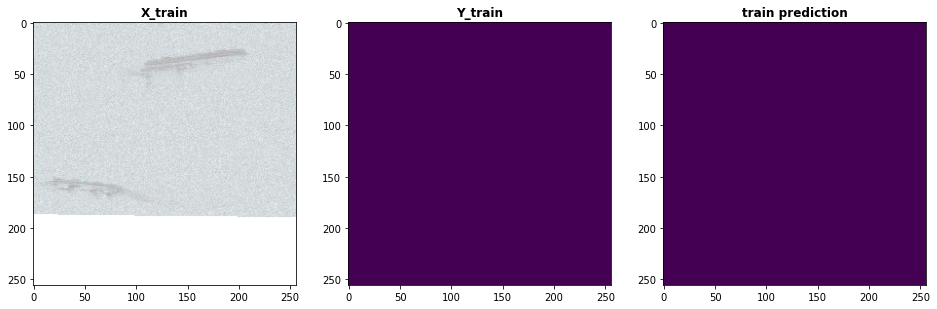

index: 49
val preds  set


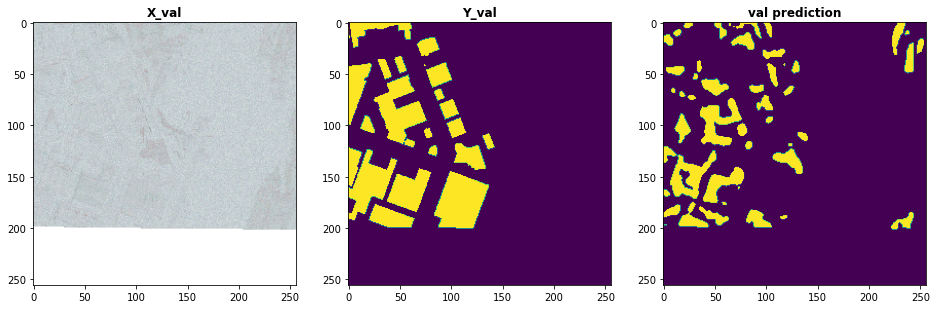

index: 74
test preds  set


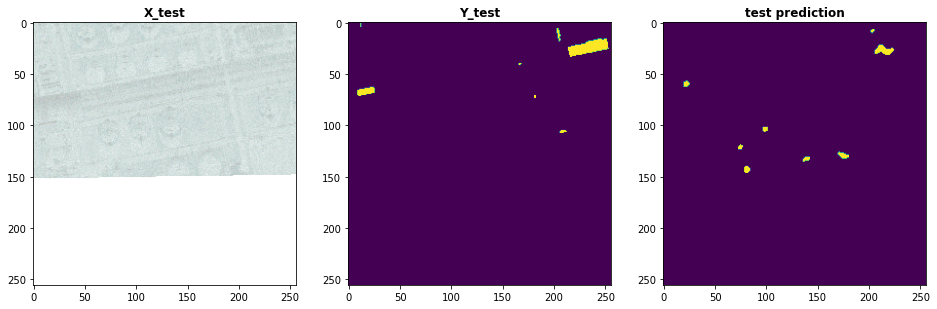

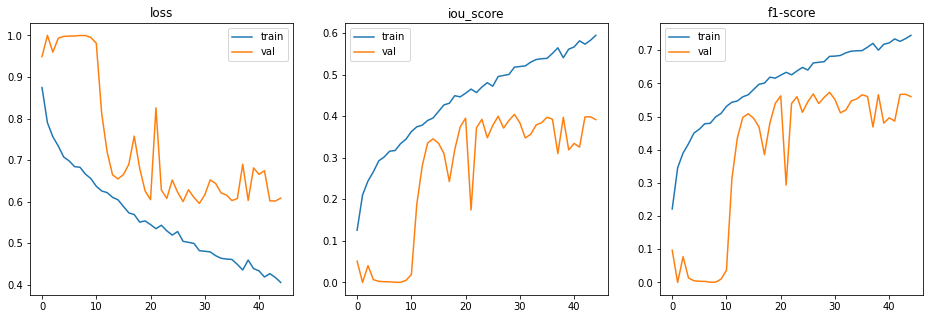

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 42

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=42, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 68s 94ms/step - loss: 0.8478 - iou_score: 0.1522 - f1-score: 0.2613 - val_loss: 0.9536 - val_iou_score: 0.0464 - val_f1-score: 0.0885
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7789 - iou_score: 0.2211 - f1-score: 0.3599 - val_loss: 0.9838 - val_iou_score: 0.0162 - val_f1-score: 0.0320
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7456 - iou_score: 0.2544 - f1-score: 0.4033 - val_loss: 0.9948 - val_iou_score: 0.0052 - val_f1-score: 0.0103
Epoch 4/100
720/720 [==============================] - 45s 63ms/step - loss: 0.7301 - iou_score: 0.2699 - f1-score: 0.4228 - val_loss: 0.9939 - val_iou_score: 0.0061 - val_f1-score: 0.0121
Epoch 5/100
720/720 [==============================] - 45s 63ms/step - loss: 0.7166 - iou_score: 0.2834 - f1-score: 0.4391 - val_loss: 0.9982 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 15ms/step
loss :  0.46978975269529555
iou_score :  0.5305154919624329
f1-score :  0.692289412021637

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9216598033905029
iou_score :  0.08132494986057281
f1-score :  0.150197371840477

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6564440965652466
iou_score :  0.3552795648574829
f1-score :  0.5229366421699524
saved model metrics


index: 660
train preds  set


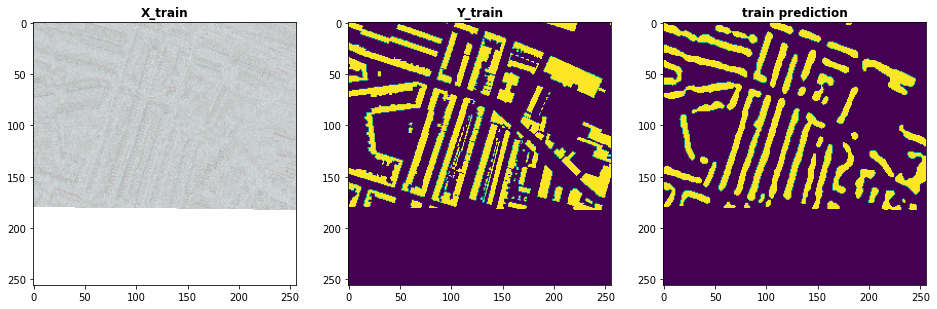

index: 7
val preds  set


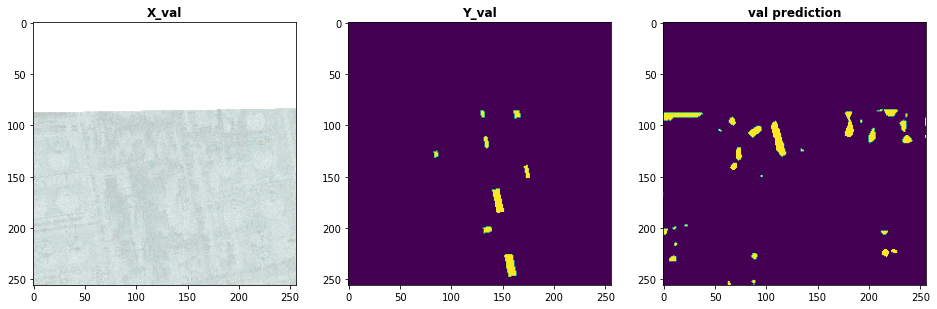

index: 33
test preds  set


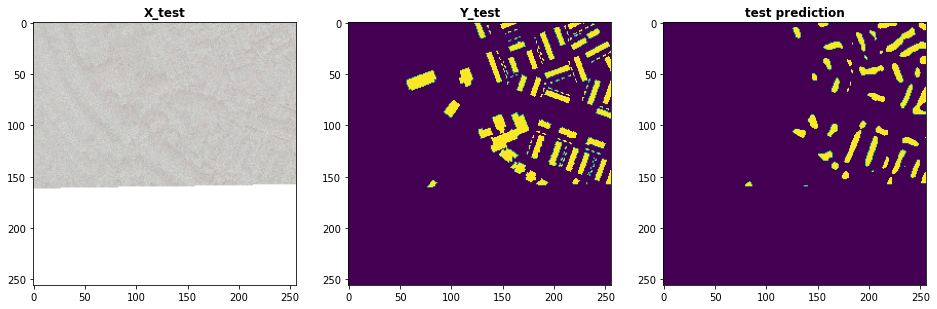

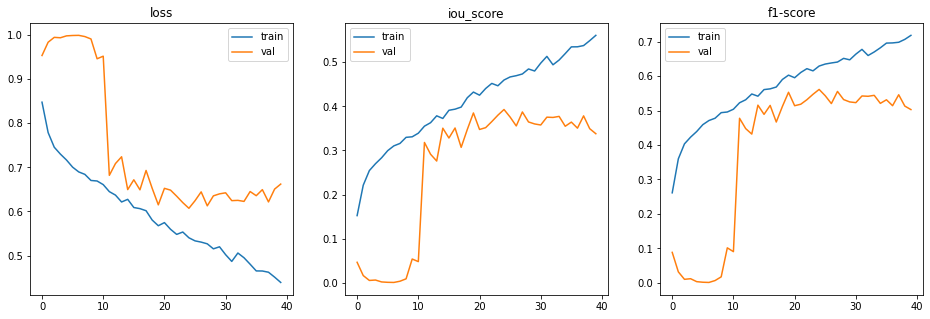

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 43

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=43, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 69s 96ms/step - loss: 0.8705 - iou_score: 0.1295 - f1-score: 0.2271 - val_loss: 0.9690 - val_iou_score: 0.0310 - val_f1-score: 0.0601
Epoch 2/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7916 - iou_score: 0.2084 - f1-score: 0.3422 - val_loss: 0.9650 - val_iou_score: 0.0350 - val_f1-score: 0.0676
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7586 - iou_score: 0.2414 - f1-score: 0.3867 - val_loss: 0.9914 - val_iou_score: 0.0086 - val_f1-score: 0.0171
Epoch 4/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7416 - iou_score: 0.2584 - f1-score: 0.4081 - val_loss: 0.9934 - val_iou_score: 0.0066 - val_f1-score: 0.0130
Epoch 5/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7166 - iou_score: 0.2834 - f1-score: 0.4386 - val_loss: 0.9992 - val_iou_score: 8.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.35411915249294706
iou_score :  0.6458092927932739
f1-score :  0.7841345071792603

validation set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  0.9134809732437134
iou_score :  0.09038487821817398
f1-score :  0.16536371409893036

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6383244633674622
iou_score :  0.37084612250328064
f1-score :  0.5401691794395447
saved model metrics


index: 214
train preds  set


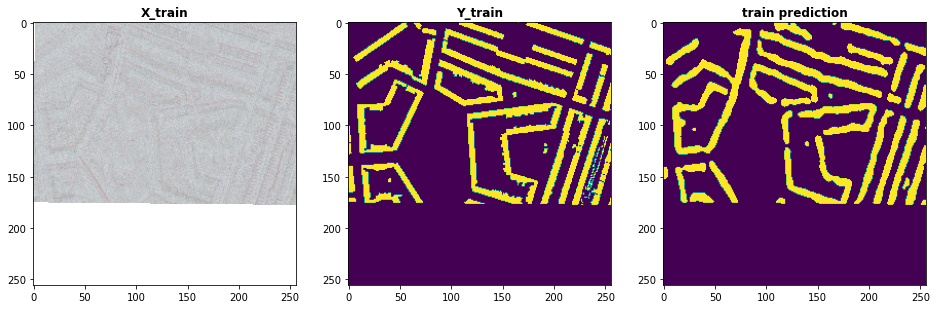

index: 37
val preds  set


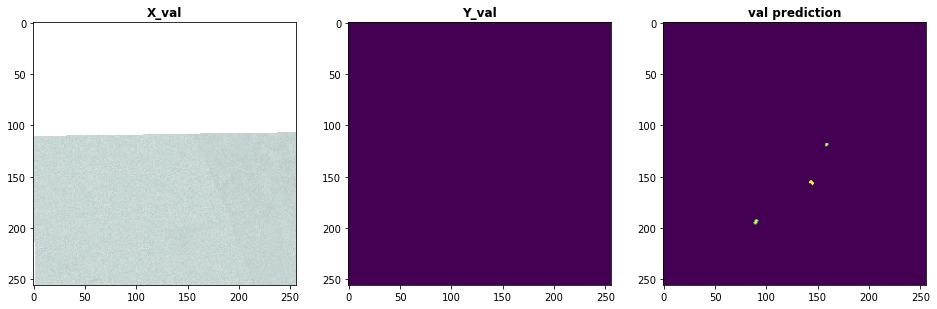

index: 73
test preds  set


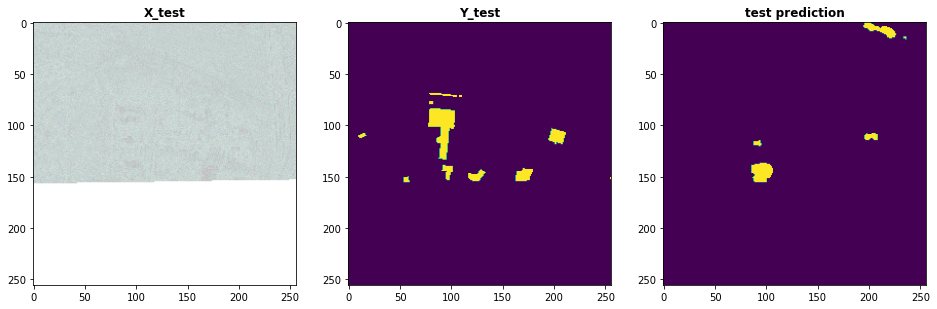

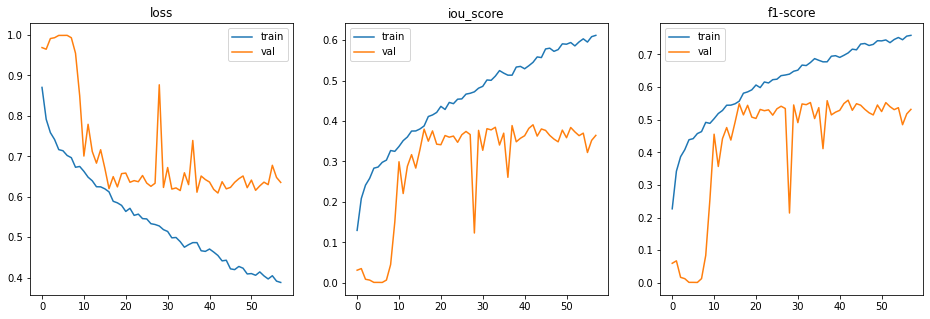

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 44

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=44, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 68s 95ms/step - loss: 0.8714 - iou_score: 0.1286 - f1-score: 0.2256 - val_loss: 0.9326 - val_iou_score: 0.0674 - val_f1-score: 0.1258
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7956 - iou_score: 0.2044 - f1-score: 0.3369 - val_loss: 0.9877 - val_iou_score: 0.0123 - val_f1-score: 0.0242
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7580 - iou_score: 0.2420 - f1-score: 0.3872 - val_loss: 0.9942 - val_iou_score: 0.0058 - val_f1-score: 0.0116
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7422 - iou_score: 0.2578 - f1-score: 0.4065 - val_loss: 0.9835 - val_iou_score: 0.0165 - val_f1-score: 0.0324
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7240 - iou_score: 0.2760 - f1-score: 0.4297 - val_loss: 0.9983 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.4341213544209798
iou_score :  0.5661352872848511
f1-score :  0.722257673740387

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.8991494655609131
iou_score :  0.10548316687345505
f1-score :  0.19031721353530884

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6289425373077393
iou_score :  0.3796278238296509
f1-score :  0.5496222972869873
saved model metrics


index: 499
train preds  set


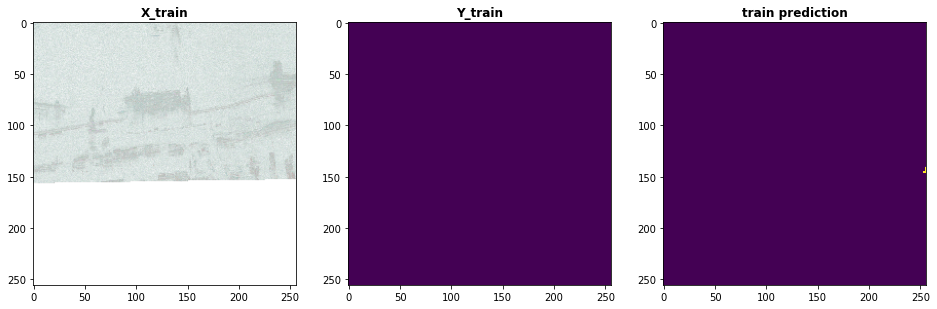

index: 1
val preds  set


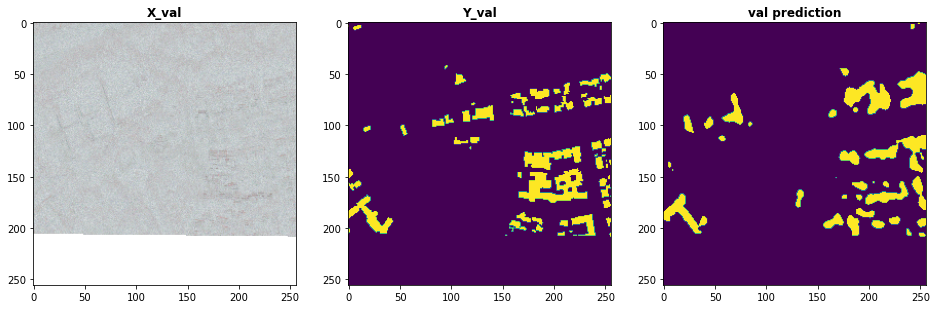

index: 14
test preds  set


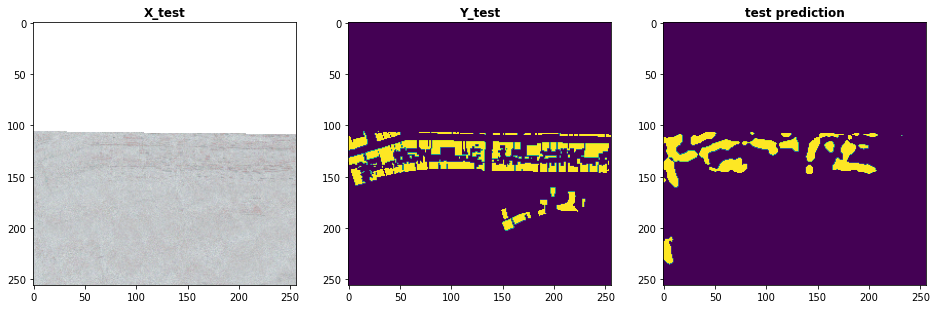

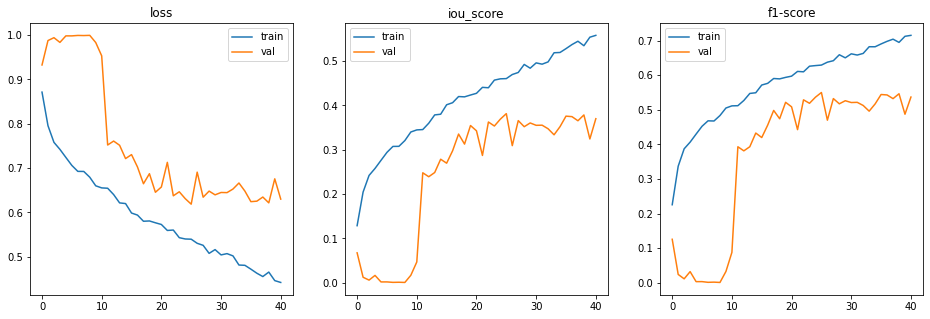

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 45

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=45, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 68s 95ms/step - loss: 0.8666 - iou_score: 0.1334 - f1-score: 0.2326 - val_loss: 0.9031 - val_iou_score: 0.0969 - val_f1-score: 0.1755
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7872 - iou_score: 0.2128 - f1-score: 0.3485 - val_loss: 0.9621 - val_iou_score: 0.0379 - val_f1-score: 0.0729
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7574 - iou_score: 0.2426 - f1-score: 0.3877 - val_loss: 0.9884 - val_iou_score: 0.0116 - val_f1-score: 0.0229
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7306 - iou_score: 0.2694 - f1-score: 0.4220 - val_loss: 0.9963 - val_iou_score: 0.0037 - val_f1-score: 0.0075
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7168 - iou_score: 0.2832 - f1-score: 0.4387 - val_loss: 0.9973 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 15ms/step
loss :  0.40791712204615277
iou_score :  0.5924040675163269
f1-score :  0.7433015704154968

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9121222019195556
iou_score :  0.09060514718294144
f1-score :  0.165948748588562

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6345283508300781
iou_score :  0.37410691380500793
f1-score :  0.5437738299369812
saved model metrics


index: 320
train preds  set


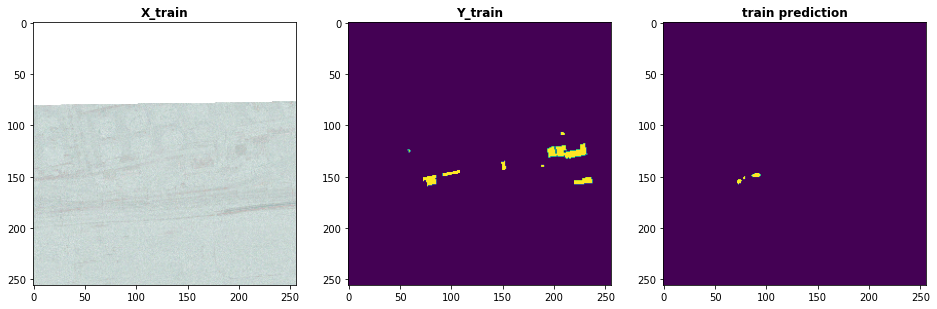

index: 77
val preds  set


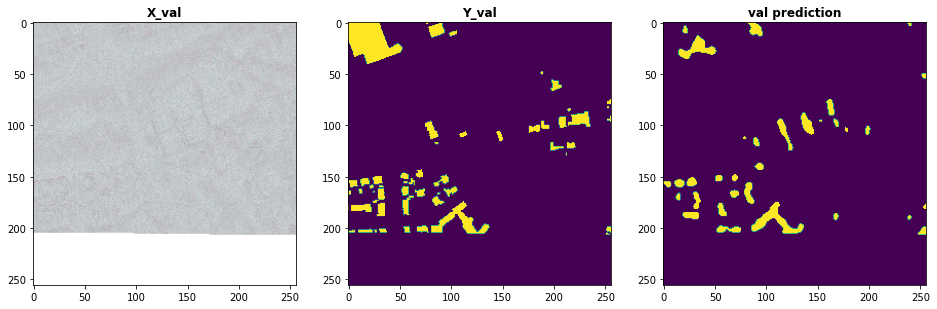

index: 33
test preds  set


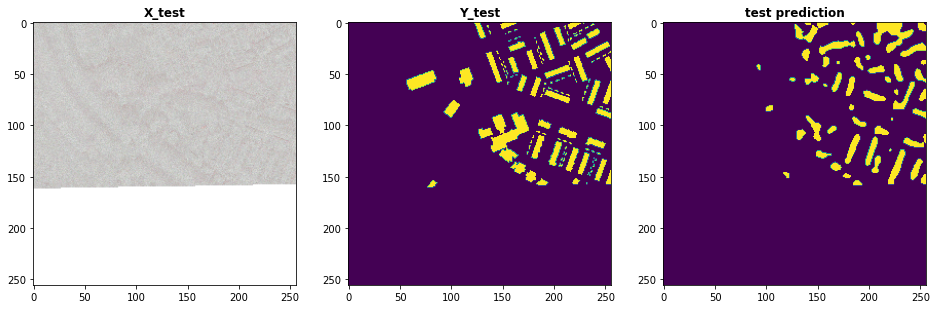

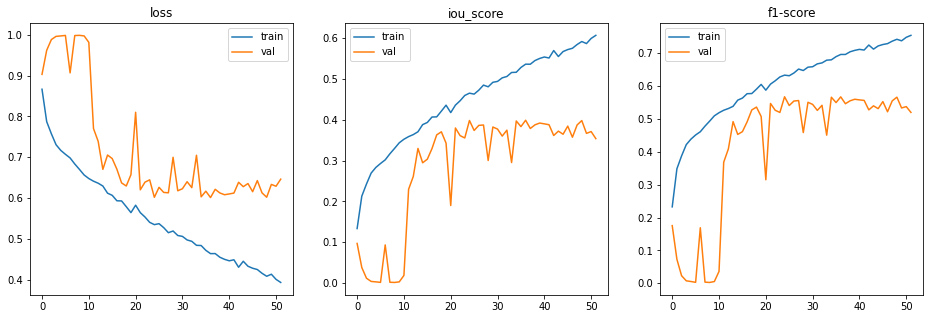

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 46

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=46, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 68s 95ms/step - loss: 0.8587 - iou_score: 0.1413 - f1-score: 0.2458 - val_loss: 0.9503 - val_iou_score: 0.0497 - val_f1-score: 0.0945
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7854 - iou_score: 0.2146 - f1-score: 0.3510 - val_loss: 0.9128 - val_iou_score: 0.0872 - val_f1-score: 0.1592
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7527 - iou_score: 0.2473 - f1-score: 0.3947 - val_loss: 0.9936 - val_iou_score: 0.0064 - val_f1-score: 0.0126
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7381 - iou_score: 0.2619 - f1-score: 0.4134 - val_loss: 0.9982 - val_iou_score: 0.0018 - val_f1-score: 0.0035
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7304 - iou_score: 0.2696 - f1-score: 0.4220 - val_loss: 0.9943 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.3992099112934536
iou_score :  0.6008350253105164
f1-score :  0.7498362064361572

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9328143119812011
iou_score :  0.07220207899808884
f1-score :  0.13404925167560577

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6853884100914002
iou_score :  0.32520410418510437
f1-score :  0.4894903600215912
saved model metrics


index: 358
train preds  set


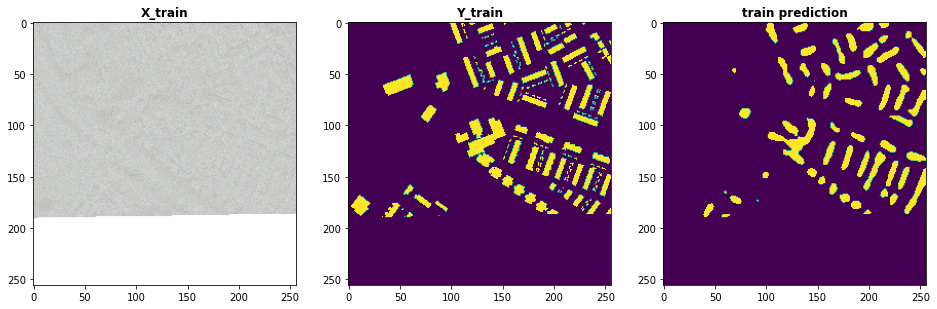

index: 23
val preds  set


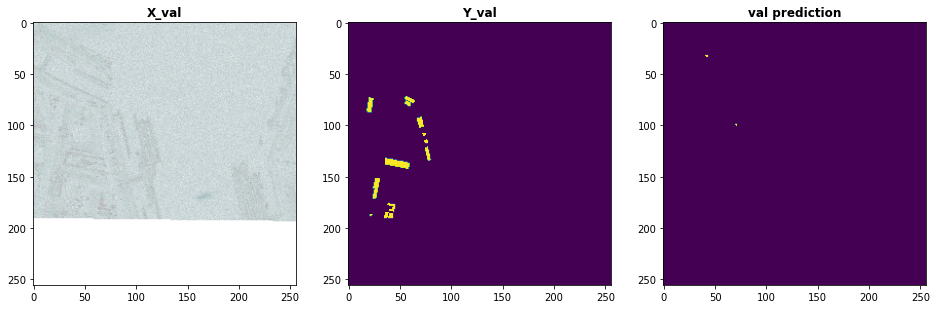

index: 65
test preds  set


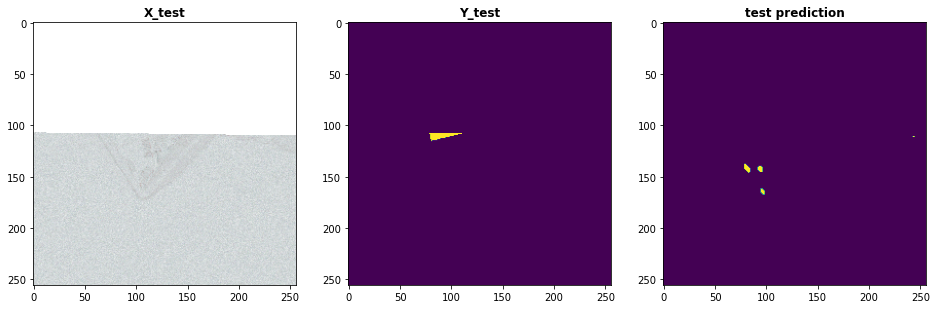

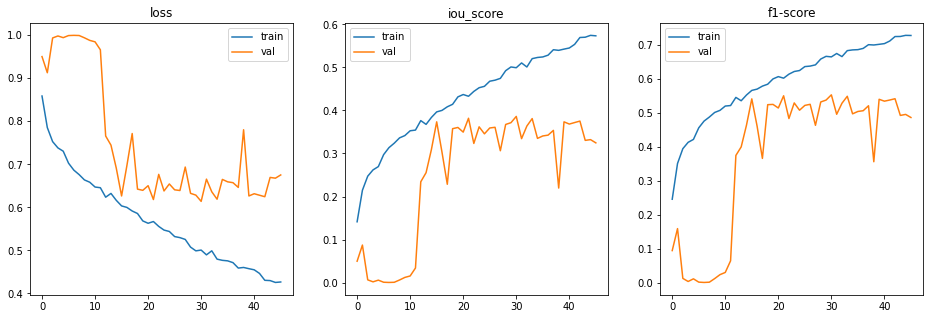

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 47

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=47, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 69s 96ms/step - loss: 0.8571 - iou_score: 0.1429 - f1-score: 0.2472 - val_loss: 0.9362 - val_iou_score: 0.0638 - val_f1-score: 0.1196
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7853 - iou_score: 0.2147 - f1-score: 0.3520 - val_loss: 0.9822 - val_iou_score: 0.0178 - val_f1-score: 0.0350
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7601 - iou_score: 0.2399 - f1-score: 0.3847 - val_loss: 0.9908 - val_iou_score: 0.0092 - val_f1-score: 0.0183
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7458 - iou_score: 0.2542 - f1-score: 0.4020 - val_loss: 0.9966 - val_iou_score: 0.0034 - val_f1-score: 0.0067
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7387 - iou_score: 0.2613 - f1-score: 0.4118 - val_loss: 0.9975 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.4044514788521661
iou_score :  0.5954053997993469
f1-score :  0.7454747557640076

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9302284121513367
iou_score :  0.073806993663311
f1-score :  0.1371137946844101

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.646234393119812
iou_score :  0.3667421042919159
f1-score :  0.5348148941993713
saved model metrics


index: 514
train preds  set


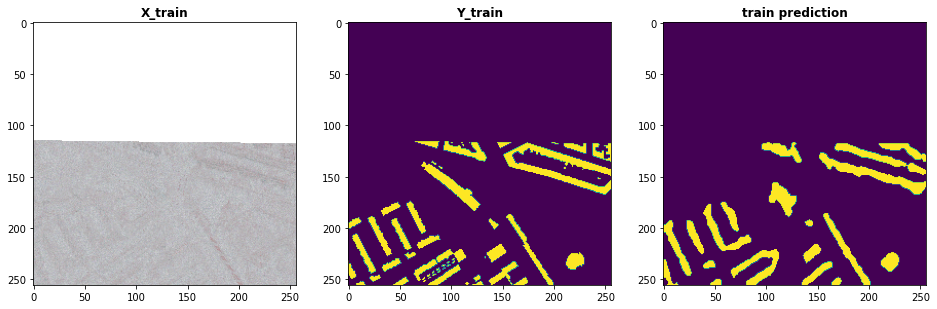

index: 55
val preds  set


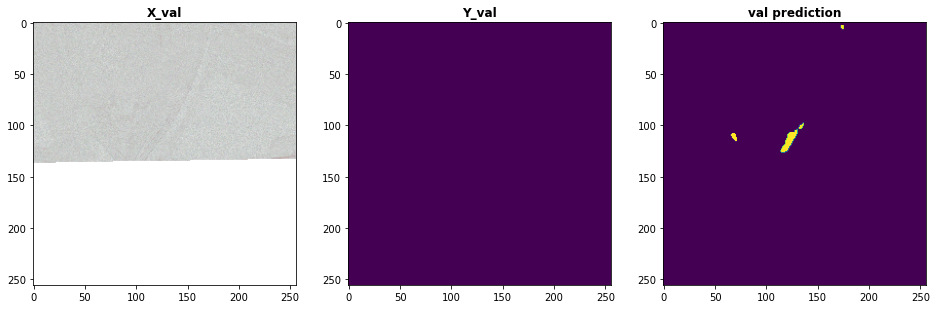

index: 13
test preds  set


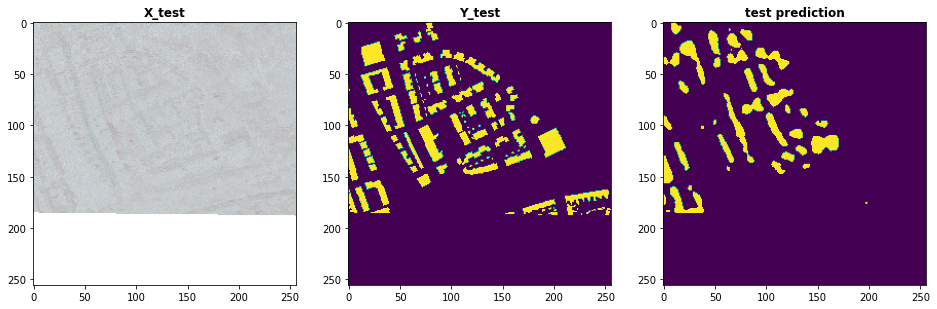

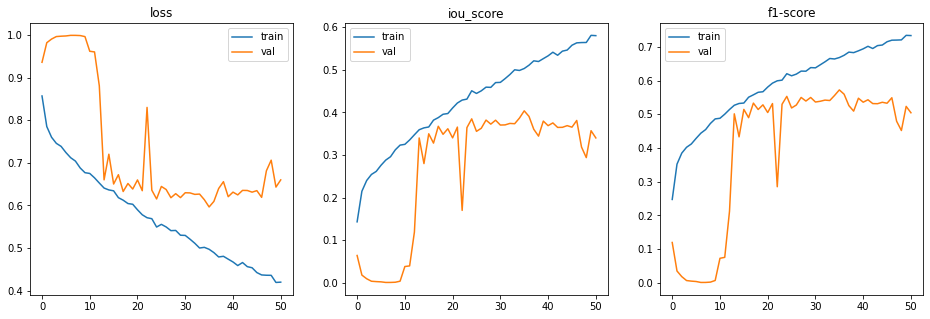

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 48

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=48, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 69s 96ms/step - loss: 0.8546 - iou_score: 0.1454 - f1-score: 0.2505 - val_loss: 0.9609 - val_iou_score: 0.0391 - val_f1-score: 0.0752
Epoch 2/100
720/720 [==============================] - 45s 63ms/step - loss: 0.7791 - iou_score: 0.2209 - f1-score: 0.3583 - val_loss: 0.9684 - val_iou_score: 0.0316 - val_f1-score: 0.0613
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7427 - iou_score: 0.2573 - f1-score: 0.4069 - val_loss: 0.9699 - val_iou_score: 0.0301 - val_f1-score: 0.0585
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7309 - iou_score: 0.2691 - f1-score: 0.4220 - val_loss: 0.9946 - val_iou_score: 0.0054 - val_f1-score: 0.0107
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7168 - iou_score: 0.2832 - f1-score: 0.4379 - val_loss: 0.9985 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.42094873852199977
iou_score :  0.579104483127594
f1-score :  0.7325975894927979

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9054136514663697
iou_score :  0.09550026804208755
f1-score :  0.17431457340717316

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6588138222694397
iou_score :  0.35292038321495056
f1-score :  0.5203501582145691
saved model metrics


index: 678
train preds  set


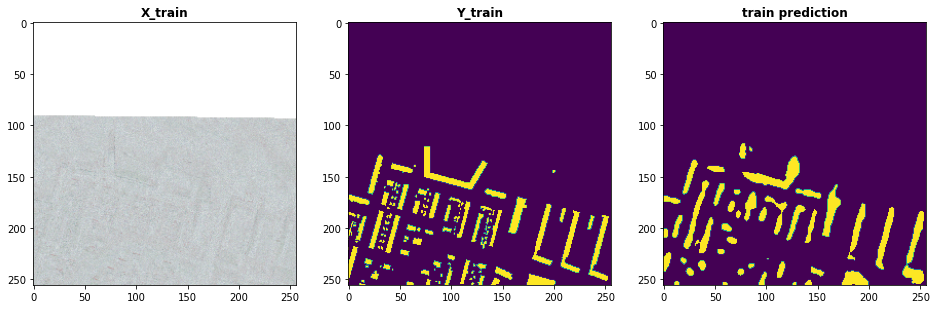

index: 39
val preds  set


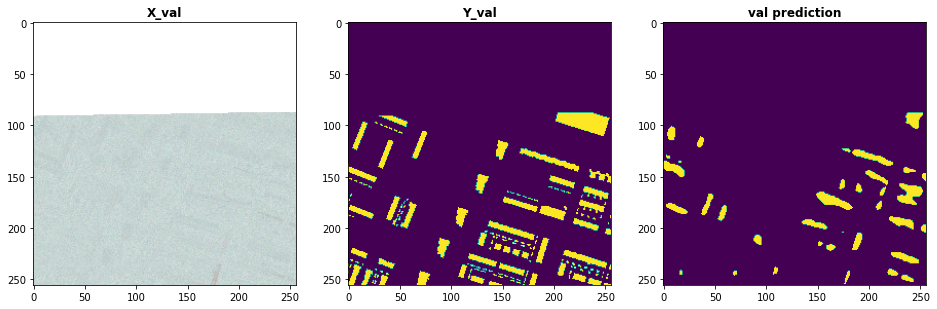

index: 49
test preds  set


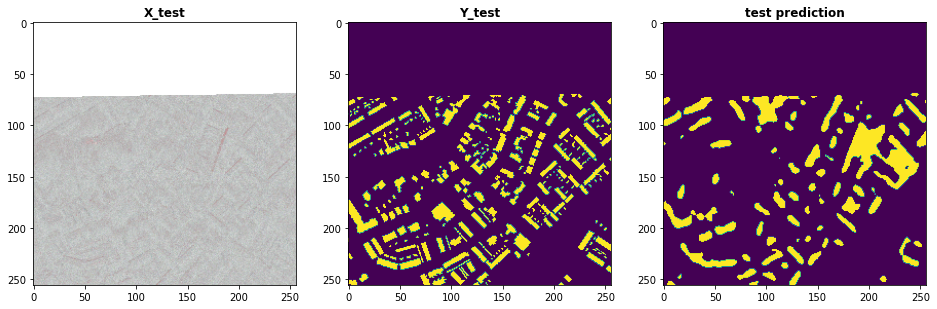

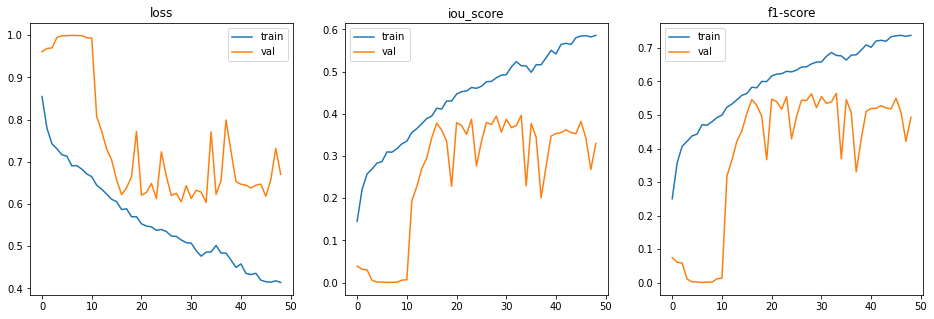

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 49

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=49, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 68s 95ms/step - loss: 0.8704 - iou_score: 0.1296 - f1-score: 0.2273 - val_loss: 0.9365 - val_iou_score: 0.0635 - val_f1-score: 0.1191
Epoch 2/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7956 - iou_score: 0.2044 - f1-score: 0.3375 - val_loss: 0.9901 - val_iou_score: 0.0099 - val_f1-score: 0.0197
Epoch 3/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7542 - iou_score: 0.2458 - f1-score: 0.3920 - val_loss: 0.9886 - val_iou_score: 0.0114 - val_f1-score: 0.0226
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7299 - iou_score: 0.2701 - f1-score: 0.4225 - val_loss: 0.9971 - val_iou_score: 0.0029 - val_f1-score: 0.0059
Epoch 5/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7288 - iou_score: 0.2712 - f1-score: 0.4237 - val_loss: 0.9975 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.4057425022125244
iou_score :  0.5940670371055603
f1-score :  0.7446275949478149

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9218231439590454
iou_score :  0.08343756198883057
f1-score :  0.15325574576854706

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6688575983047486
iou_score :  0.34067502617836
f1-score :  0.507286012172699
saved model metrics


index: 315
train preds  set


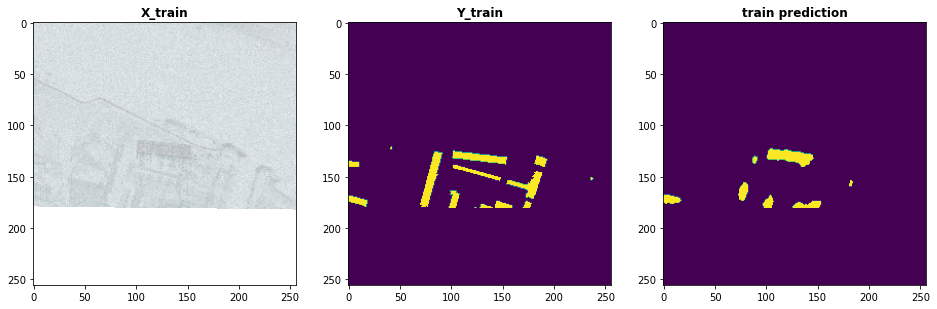

index: 28
val preds  set


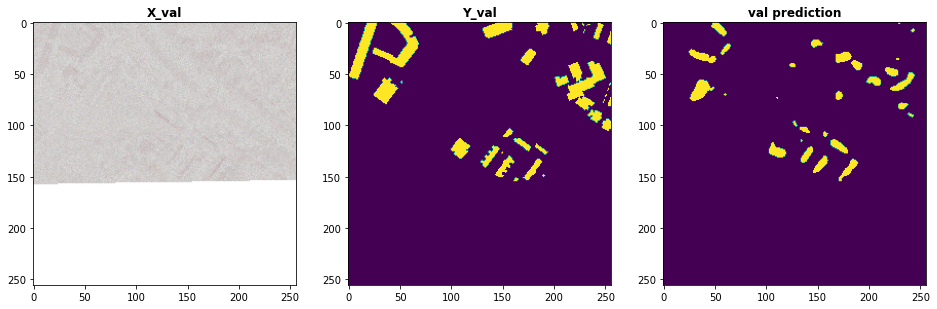

index: 25
test preds  set


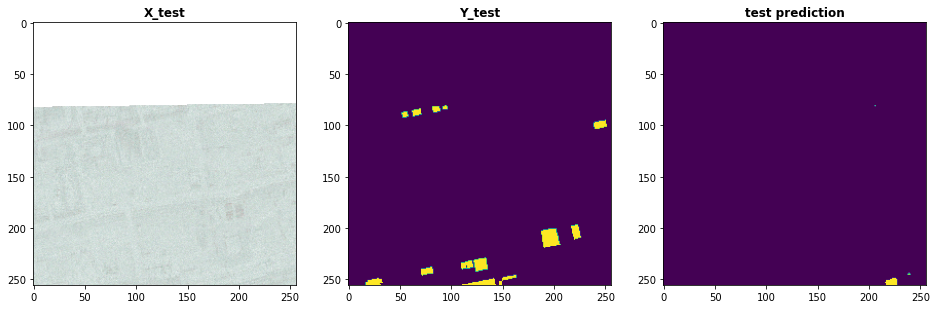

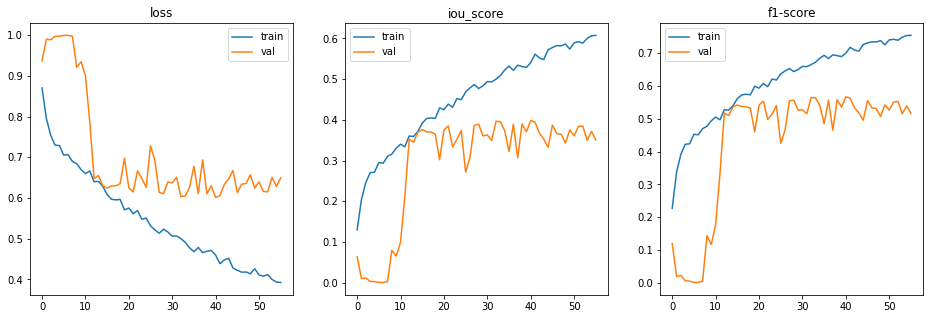

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 50

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=50, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 71s 98ms/step - loss: 0.8705 - iou_score: 0.1295 - f1-score: 0.2269 - val_loss: 0.9324 - val_iou_score: 0.0676 - val_f1-score: 0.1261
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.8098 - iou_score: 0.1902 - f1-score: 0.3179 - val_loss: 0.9479 - val_iou_score: 0.0521 - val_f1-score: 0.0988
Epoch 3/100
720/720 [==============================] - 45s 63ms/step - loss: 0.7680 - iou_score: 0.2320 - f1-score: 0.3741 - val_loss: 0.9836 - val_iou_score: 0.0164 - val_f1-score: 0.0323
Epoch 4/100
720/720 [==============================] - 45s 63ms/step - loss: 0.7520 - iou_score: 0.2480 - f1-score: 0.3946 - val_loss: 0.9917 - val_iou_score: 0.0083 - val_f1-score: 0.0165
Epoch 5/100
720/720 [==============================] - 45s 63ms/step - loss: 0.7286 - iou_score: 0.2714 - f1-score: 0.4240 - val_loss: 0.9947 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.42494175434112547
iou_score :  0.5750506520271301
f1-score :  0.729265570640564

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.9162856698036194
iou_score :  0.08844461292028427
f1-score :  0.16195067763328552

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6354708194732666
iou_score :  0.3730826675891876
f1-score :  0.5427149534225464
saved model metrics


index: 709
train preds  set


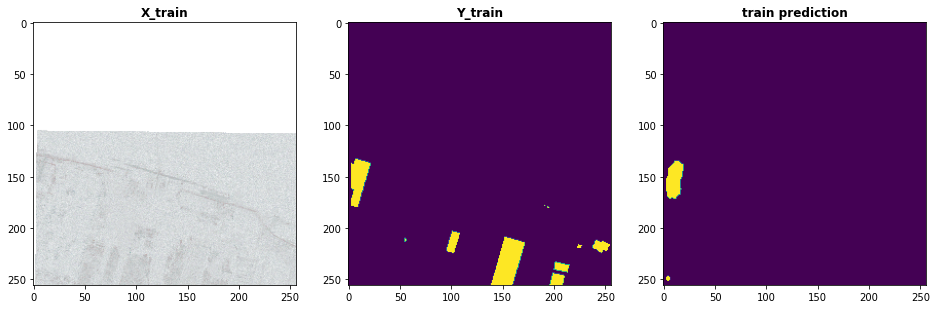

index: 53
val preds  set


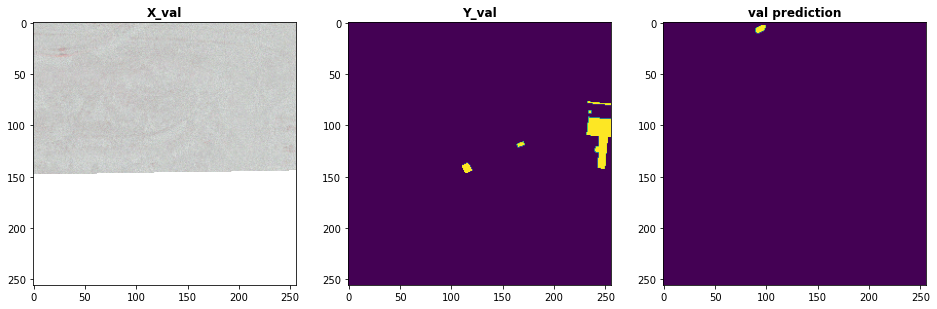

index: 49
test preds  set


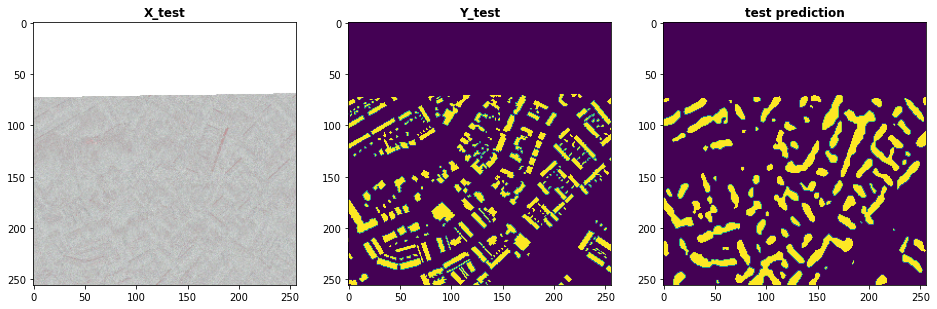

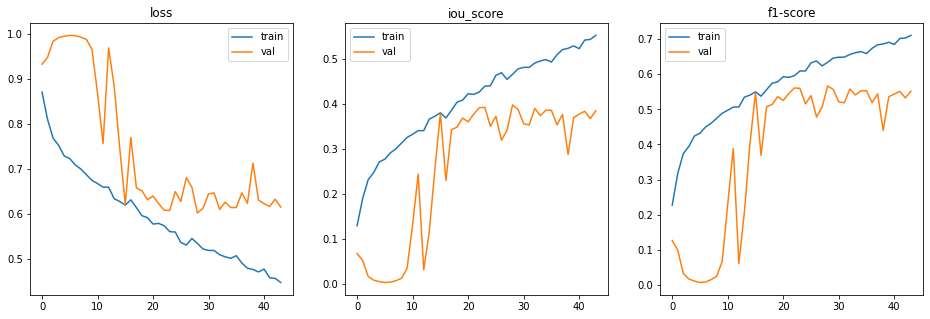

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

## Experiment 1F: Not rotated

### ID 51

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=51, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 69s 96ms/step - loss: 0.8712 - iou_score: 0.1288 - f1-score: 0.2259 - val_loss: 0.9500 - val_iou_score: 0.0500 - val_f1-score: 0.0952
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.8006 - iou_score: 0.1994 - f1-score: 0.3307 - val_loss: 0.9854 - val_iou_score: 0.0146 - val_f1-score: 0.0288
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7543 - iou_score: 0.2457 - f1-score: 0.3920 - val_loss: 0.9955 - val_iou_score: 0.0045 - val_f1-score: 0.0089
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7311 - iou_score: 0.2689 - f1-score: 0.4220 - val_loss: 0.9978 - val_iou_score: 0.0022 - val_f1-score: 0.0044
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7134 - iou_score: 0.2866 - f1-score: 0.4430 - val_loss: 0.9991 - val_iou_score: 9.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 52

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=52, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE                                      # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Just loading weights
model saved


In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 12s 17ms/step
loss :  0.4186110920376248
iou_score :  0.5814288854598999
f1-score :  0.7345702052116394

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.8973186254501343
iou_score :  0.10658558458089828
f1-score :  0.19229550659656525

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.631144118309021
iou_score :  0.37732192873954773
f1-score :  0.5470691323280334
saved model metrics


index: 626
train preds  set


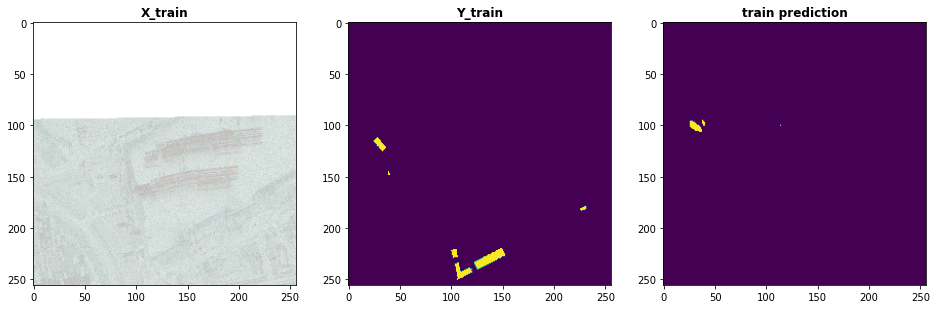

index: 39
val preds  set


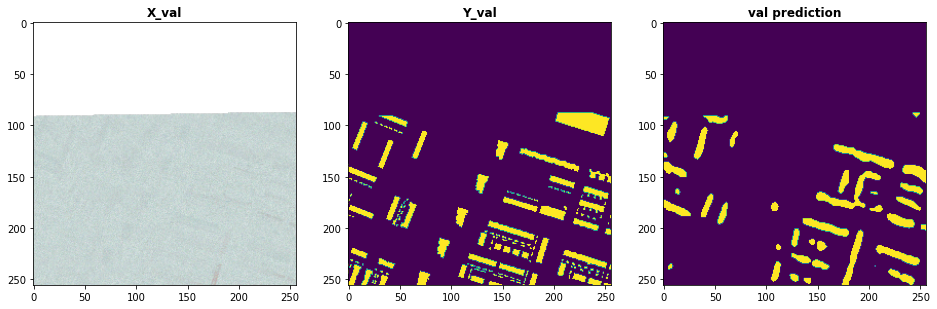

index: 32
test preds  set


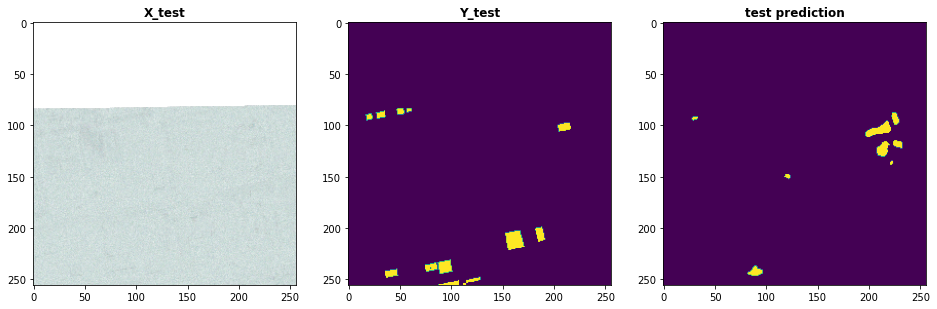

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 53

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=53, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Just loading weights
model saved


In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 12s 17ms/step
loss :  0.4152960353427463
iou_score :  0.5849074125289917
f1-score :  0.7373731136322021

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9050581216812134
iou_score :  0.09911859035491943
f1-score :  0.17995524406433105

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6352299690246582
iou_score :  0.37362706661224365
f1-score :  0.5432015061378479
saved model metrics


index: 702
train preds  set


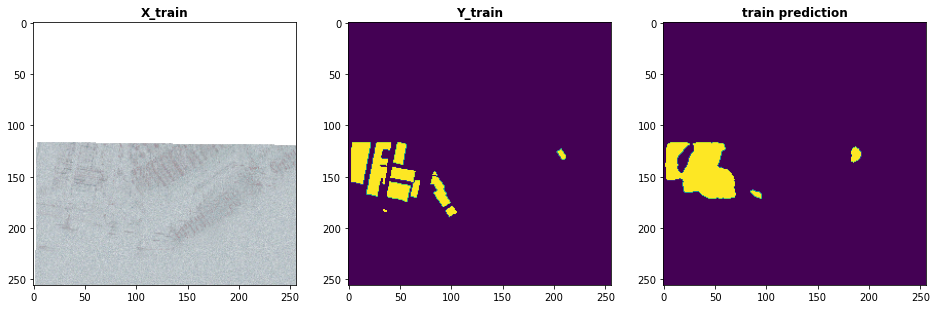

index: 56
val preds  set


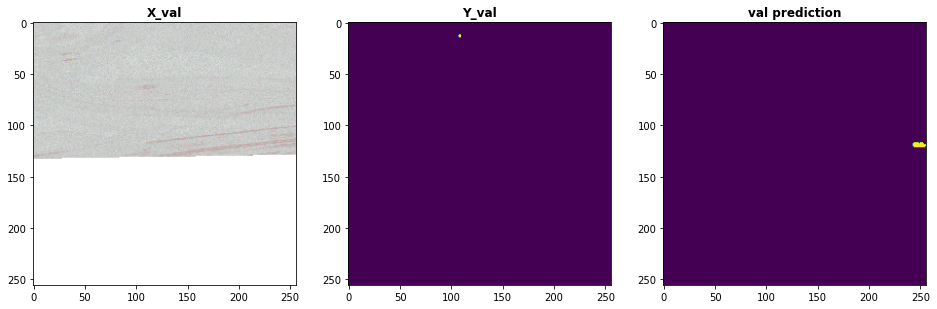

index: 19
test preds  set


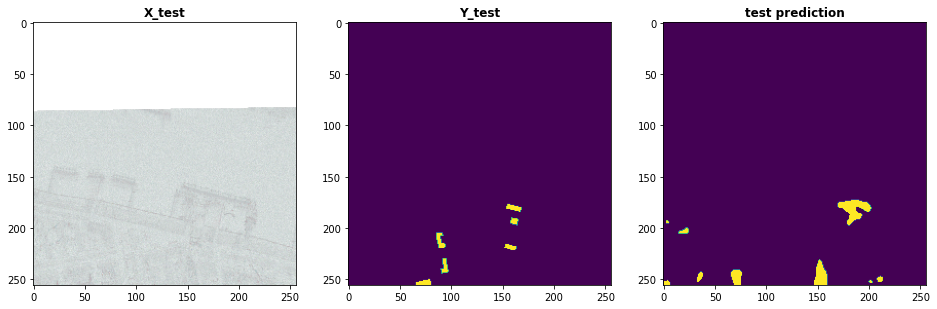

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 54

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=54, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Just loading weights
model saved


In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 12s 17ms/step
loss :  0.40161221159829036
iou_score :  0.5982628464698792
f1-score :  0.748049795627594

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.8879268884658813
iou_score :  0.1170744076371193
f1-score :  0.20901967585086823

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6279870510101319
iou_score :  0.3805079758167267
f1-score :  0.5503236055374146
saved model metrics


index: 506
train preds  set


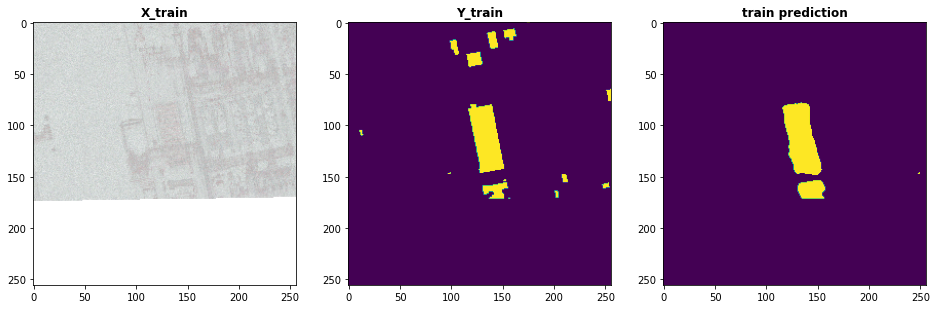

index: 23
val preds  set


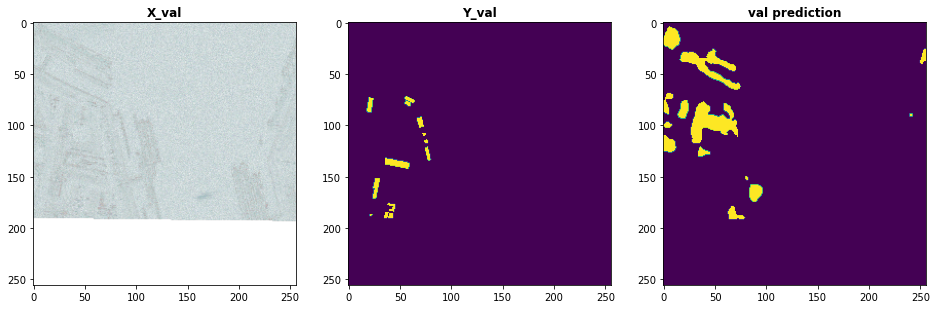

index: 33
test preds  set


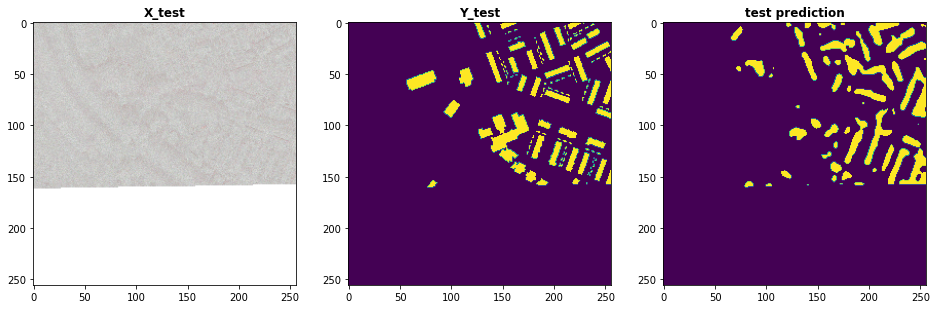

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 55

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=55, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 77s 107ms/step - loss: 0.8698 - iou_score: 0.1302 - f1-score: 0.2284 - val_loss: 0.9191 - val_iou_score: 0.0809 - val_f1-score: 0.1488
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.8081 - iou_score: 0.1919 - f1-score: 0.3199 - val_loss: 0.9187 - val_iou_score: 0.0813 - val_f1-score: 0.1492
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7710 - iou_score: 0.2290 - f1-score: 0.3699 - val_loss: 0.9953 - val_iou_score: 0.0047 - val_f1-score: 0.0093
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7445 - iou_score: 0.2555 - f1-score: 0.4048 - val_loss: 0.9170 - val_iou_score: 0.0830 - val_f1-score: 0.1523
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7191 - iou_score: 0.2809 - f1-score: 0.4366 - val_loss: 0.9992 - val_iou_score: 7

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 15ms/step
loss :  0.33274433347913956
iou_score :  0.6668249368667603
f1-score :  0.7996129393577576

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9119656443595886
iou_score :  0.09106244891881943
f1-score :  0.1667010635137558

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6581153750419617
iou_score :  0.353947252035141
f1-score :  0.5213705897331238
saved model metrics


index: 366
train preds  set


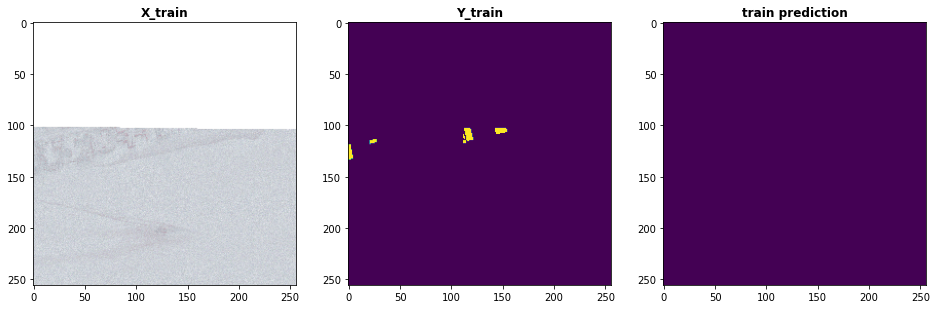

index: 33
val preds  set


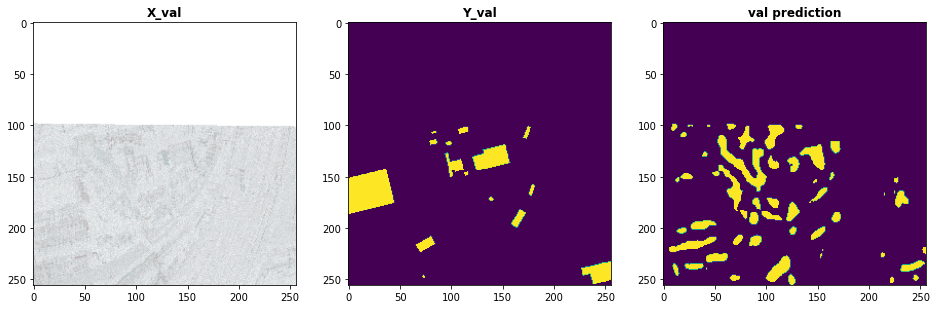

index: 45
test preds  set


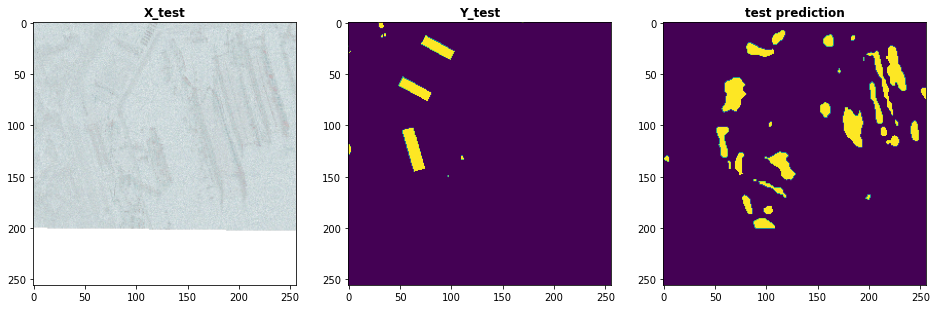

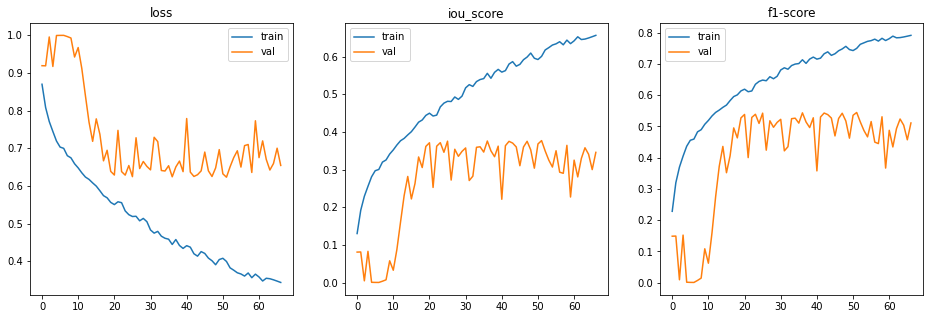

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 56

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=56, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 67s 93ms/step - loss: 0.8743 - iou_score: 0.1257 - f1-score: 0.2219 - val_loss: 0.9386 - val_iou_score: 0.0614 - val_f1-score: 0.1153
Epoch 2/100
720/720 [==============================] - 46s 64ms/step - loss: 0.8051 - iou_score: 0.1949 - f1-score: 0.3236 - val_loss: 0.9778 - val_iou_score: 0.0222 - val_f1-score: 0.0433
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7642 - iou_score: 0.2358 - f1-score: 0.3786 - val_loss: 0.9930 - val_iou_score: 0.0070 - val_f1-score: 0.0138
Epoch 4/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7424 - iou_score: 0.2576 - f1-score: 0.4073 - val_loss: 0.9955 - val_iou_score: 0.0045 - val_f1-score: 0.0090
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7193 - iou_score: 0.2807 - f1-score: 0.4360 - val_loss: 0.9978 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.46228021648195056
iou_score :  0.5379519462585449
f1-score :  0.6987655758857727

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9059855103492737
iou_score :  0.0972050204873085
f1-score :  0.17694814503192902

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6466516613960266
iou_score :  0.363076776266098
f1-score :  0.5317633152008057
saved model metrics


index: 197
train preds  set


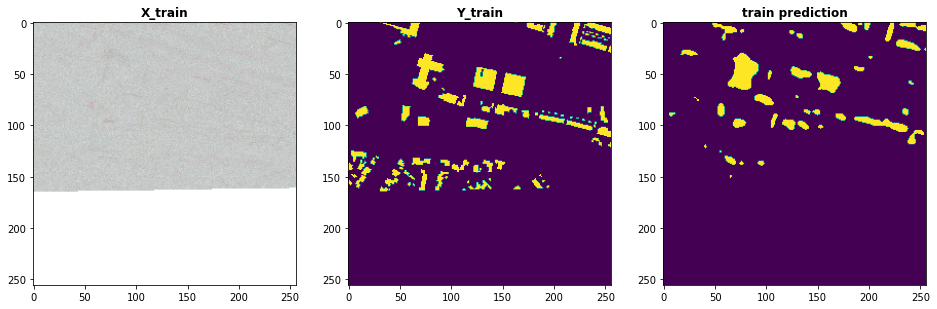

index: 72
val preds  set


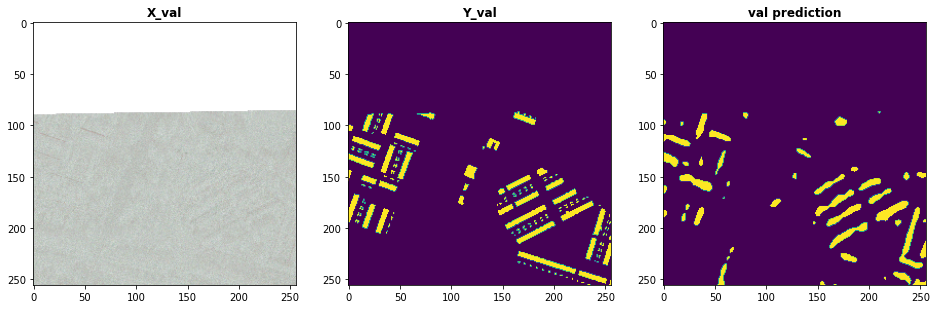

index: 70
test preds  set


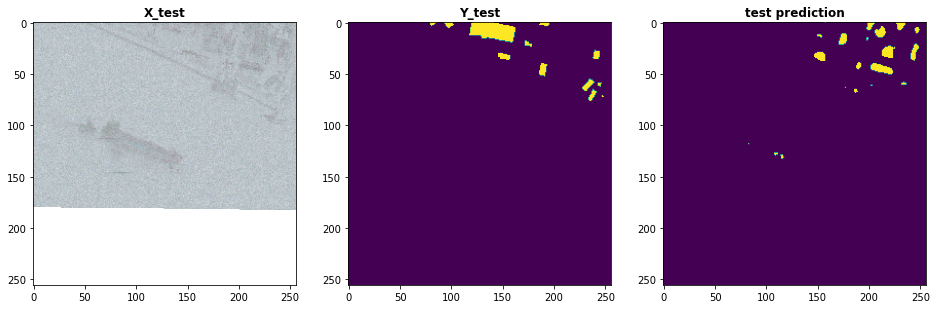

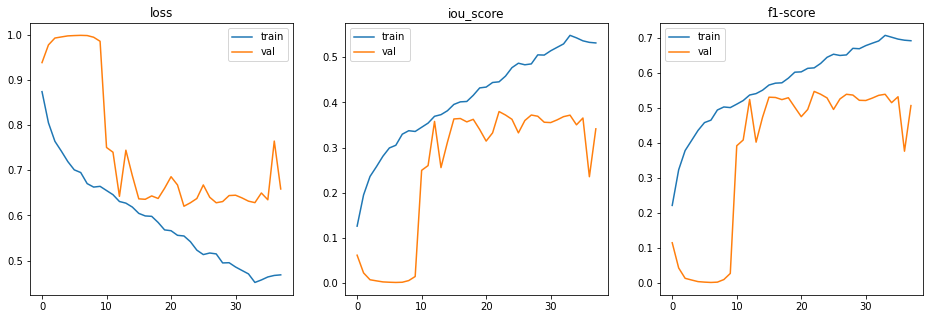

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 57

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=57, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 67s 93ms/step - loss: 0.8967 - iou_score: 0.1033 - f1-score: 0.1860 - val_loss: 0.9135 - val_iou_score: 0.0865 - val_f1-score: 0.1579
Epoch 2/100
720/720 [==============================] - 46s 63ms/step - loss: 0.8412 - iou_score: 0.1588 - f1-score: 0.2717 - val_loss: 0.9140 - val_iou_score: 0.0860 - val_f1-score: 0.1572
Epoch 3/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7787 - iou_score: 0.2213 - f1-score: 0.3596 - val_loss: 0.9269 - val_iou_score: 0.0731 - val_f1-score: 0.1357
Epoch 4/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7389 - iou_score: 0.2611 - f1-score: 0.4124 - val_loss: 0.9774 - val_iou_score: 0.0226 - val_f1-score: 0.0443
Epoch 5/100
720/720 [==============================] - 45s 63ms/step - loss: 0.7179 - iou_score: 0.2821 - f1-score: 0.4374 - val_loss: 0.9936 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.38068222337298924
iou_score :  0.6192810535430908
f1-score :  0.7640348672866821

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.910650372505188
iou_score :  0.0940314531326294
f1-score :  0.17136859893798828

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6253291368484497
iou_score :  0.3872953951358795
f1-score :  0.556854784488678
saved model metrics


index: 274
train preds  set


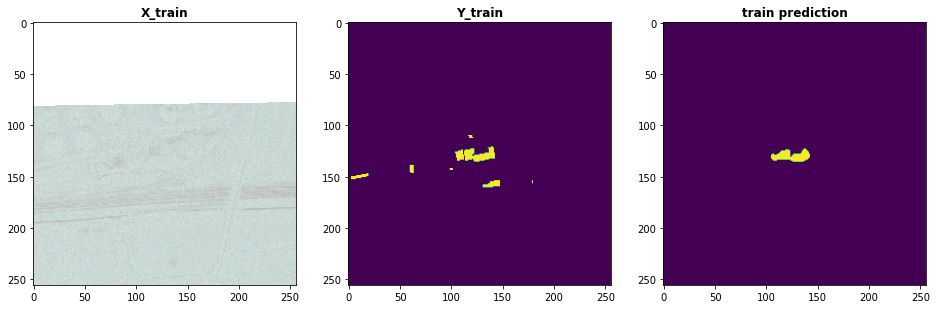

index: 69
val preds  set


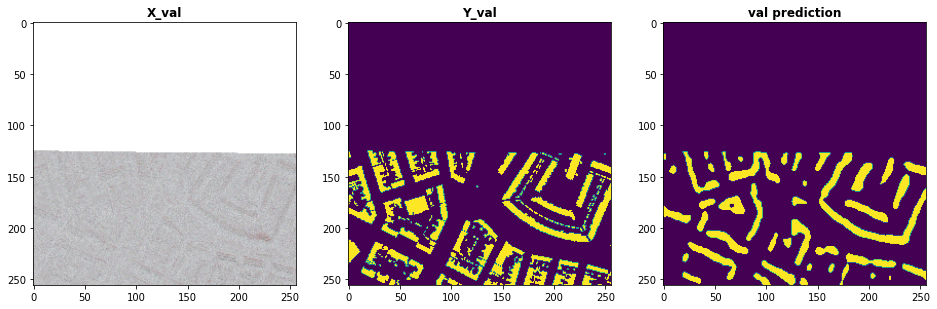

index: 54
test preds  set


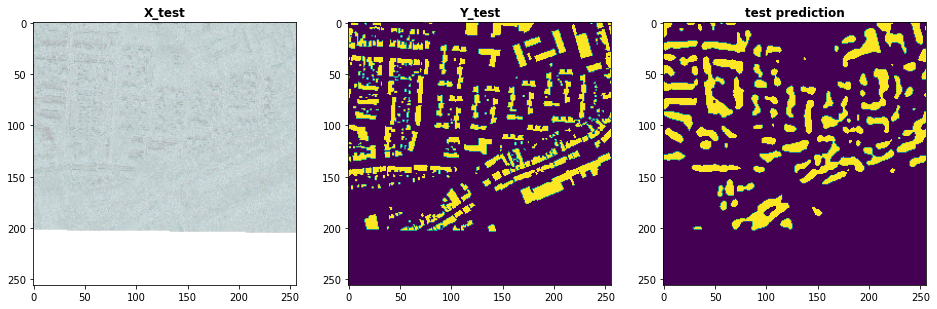

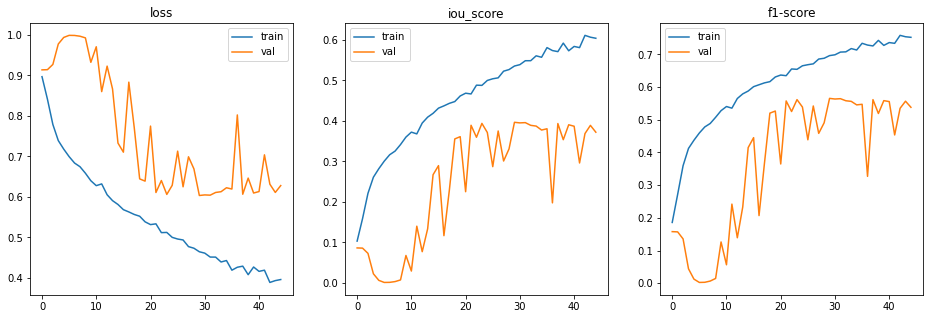

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 58

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=58, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 68s 94ms/step - loss: 0.8553 - iou_score: 0.1447 - f1-score: 0.2501 - val_loss: 0.9450 - val_iou_score: 0.0550 - val_f1-score: 0.1040
Epoch 2/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7858 - iou_score: 0.2142 - f1-score: 0.3510 - val_loss: 0.9829 - val_iou_score: 0.0171 - val_f1-score: 0.0336
Epoch 3/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7532 - iou_score: 0.2468 - f1-score: 0.3928 - val_loss: 0.9931 - val_iou_score: 0.0069 - val_f1-score: 0.0137
Epoch 4/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7261 - iou_score: 0.2739 - f1-score: 0.4280 - val_loss: 0.9939 - val_iou_score: 0.0061 - val_f1-score: 0.0121
Epoch 5/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7130 - iou_score: 0.2870 - f1-score: 0.4441 - val_loss: 0.9986 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 15ms/step
loss :  0.44052994516160754
iou_score :  0.5594169497489929
f1-score :  0.716861367225647

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9104453563690186
iou_score :  0.09419835358858109
f1-score :  0.1716814786195755

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6284865617752076
iou_score :  0.38001391291618347
f1-score :  0.5499793887138367
saved model metrics


index: 431
train preds  set


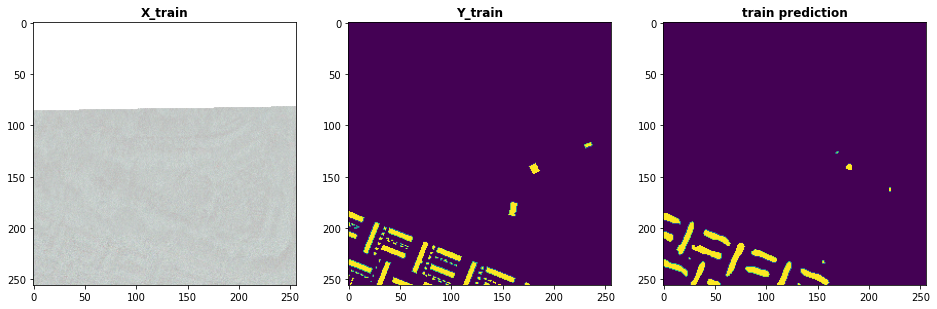

index: 38
val preds  set


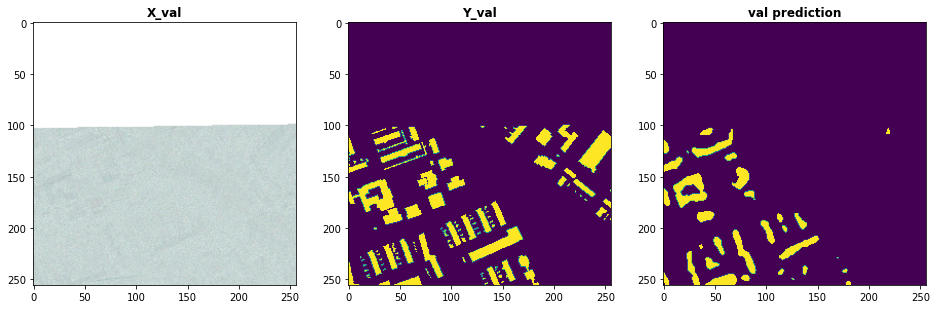

index: 72
test preds  set


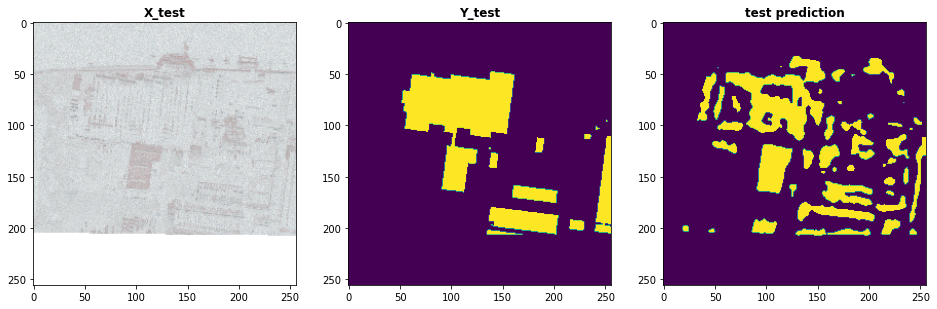

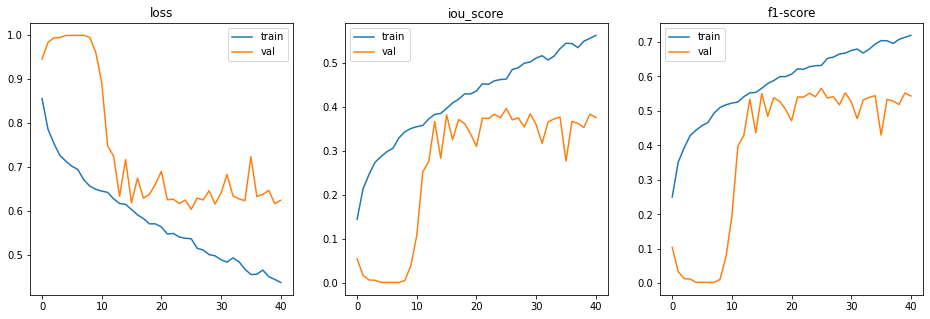

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 59

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=59, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 68s 94ms/step - loss: 0.8673 - iou_score: 0.1327 - f1-score: 0.2317 - val_loss: 0.9424 - val_iou_score: 0.0576 - val_f1-score: 0.1087
Epoch 2/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7972 - iou_score: 0.2028 - f1-score: 0.3338 - val_loss: 0.9555 - val_iou_score: 0.0445 - val_f1-score: 0.0852
Epoch 3/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7660 - iou_score: 0.2340 - f1-score: 0.3762 - val_loss: 0.9919 - val_iou_score: 0.0081 - val_f1-score: 0.0161
Epoch 4/100
720/720 [==============================] - 46s 64ms/step - loss: 0.7511 - iou_score: 0.2489 - f1-score: 0.3966 - val_loss: 0.9839 - val_iou_score: 0.0161 - val_f1-score: 0.0318
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7333 - iou_score: 0.2667 - f1-score: 0.4188 - val_loss: 0.9958 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 15ms/step
loss :  0.4579503708415561
iou_score :  0.5414861440658569
f1-score :  0.7011996507644653

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.9335181951522827
iou_score :  0.07130757719278336
f1-score :  0.13245725631713867

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.687797737121582
iou_score :  0.3286289870738983
f1-score :  0.4918564558029175
saved model metrics


index: 627
train preds  set


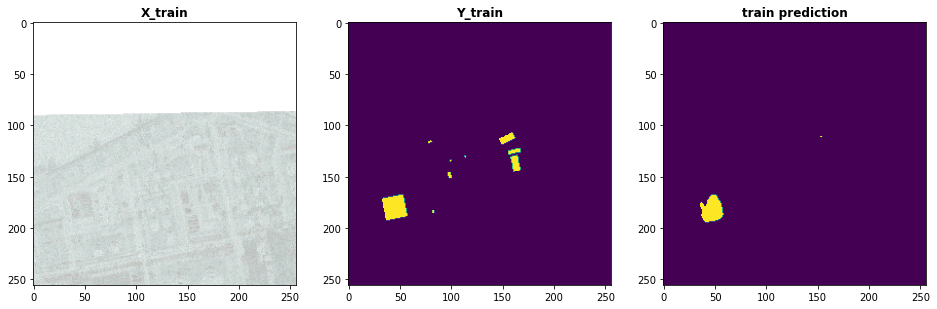

index: 50
val preds  set


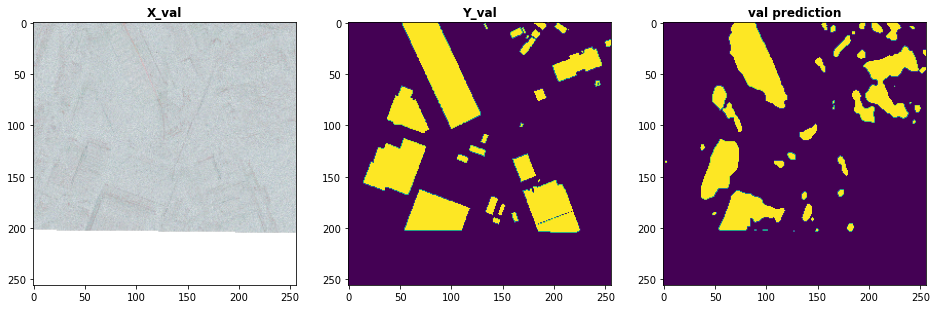

index: 31
test preds  set


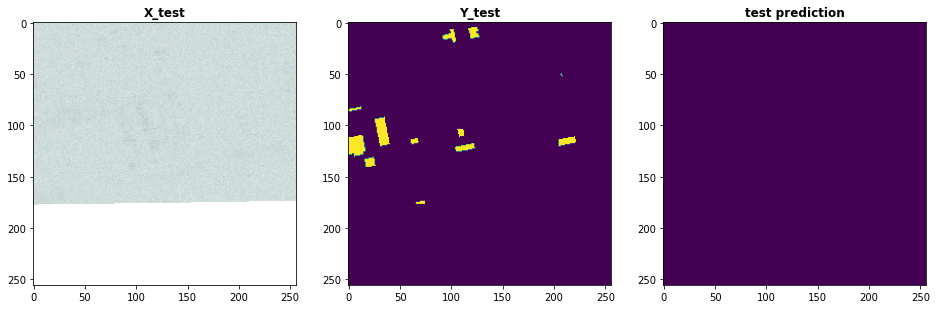

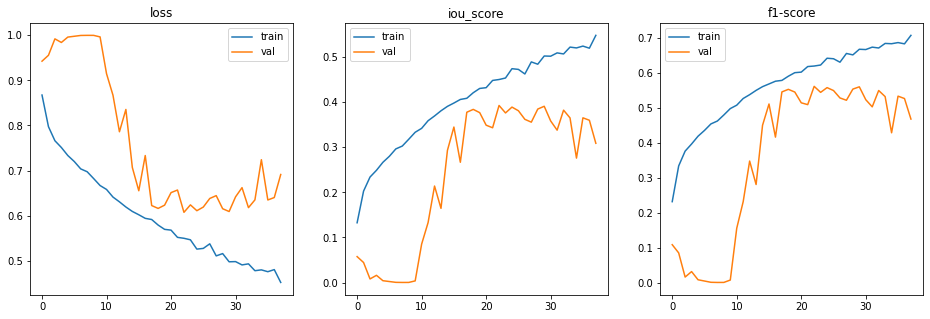

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 60

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 16, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=60, MODEL_COMMENTS='normalization test, early stopping patience 15')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 68s 94ms/step - loss: 0.8698 - iou_score: 0.1302 - f1-score: 0.2280 - val_loss: 0.9851 - val_iou_score: 0.0149 - val_f1-score: 0.0294
Epoch 2/100
720/720 [==============================] - 45s 63ms/step - loss: 0.8067 - iou_score: 0.1933 - f1-score: 0.3214 - val_loss: 0.9601 - val_iou_score: 0.0399 - val_f1-score: 0.0766
Epoch 3/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7666 - iou_score: 0.2334 - f1-score: 0.3760 - val_loss: 0.9898 - val_iou_score: 0.0102 - val_f1-score: 0.0201
Epoch 4/100
720/720 [==============================] - 45s 63ms/step - loss: 0.7475 - iou_score: 0.2525 - f1-score: 0.4014 - val_loss: 0.9874 - val_iou_score: 0.0126 - val_f1-score: 0.0249
Epoch 5/100
720/720 [==============================] - 46s 63ms/step - loss: 0.7399 - iou_score: 0.2601 - f1-score: 0.4090 - val_loss: 0.9984 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 15ms/step
loss :  0.407628419664171
iou_score :  0.5921865701675415
f1-score :  0.7432178854942322

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.9025764107704163
iou_score :  0.10196763277053833
f1-score :  0.18459022045135498

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6249348878860473
iou_score :  0.3840705156326294
f1-score :  0.554232120513916
saved model metrics


index: 547
train preds  set


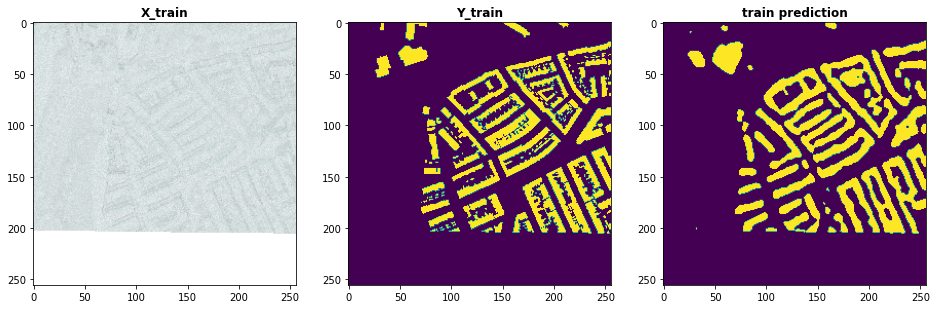

index: 45
val preds  set


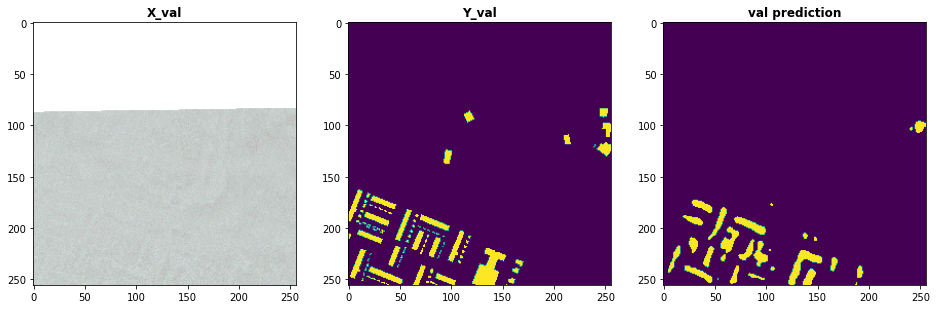

index: 38
test preds  set


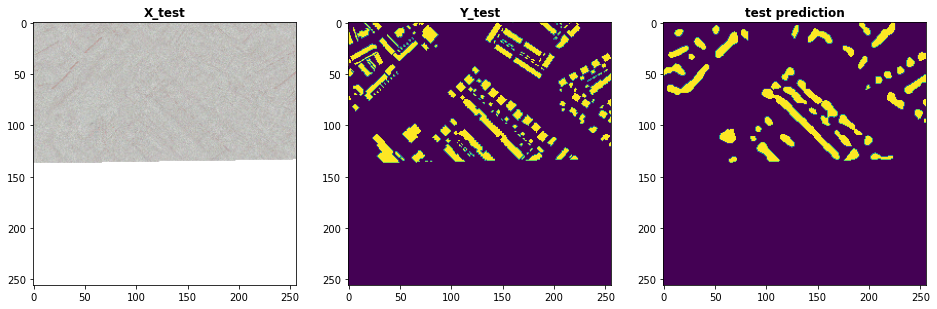

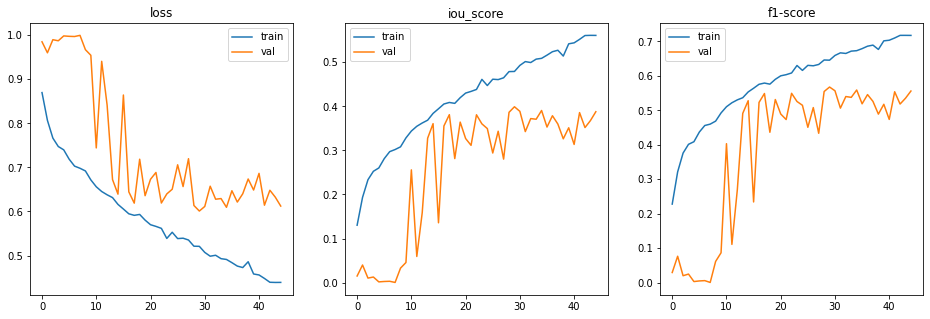

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

## Findings

Normalization does not help the efficientnetb0 model